**Objectifs**

1) - prédire les émissions de CO2 et la consommation totale d’énergie de bâtiments non destinés à l’habitation
Votre prédiction se basera sur les données structurelles des bâtiments (taille et usage des bâtiments, date de construction, situation géographique, ...)

2) - évaluer l’intérêt de l’"ENERGY STAR Score" pour la prédiction d’émissions, qui est fastidieux à calculer avec l’approche utilisée actuellement par votre équipe. Vous l'intégrerez dans la modélisation et jugerez de son intérêt.

## Imports

In [138]:
# General Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import os, pickle
import time
from datetime import datetime
from IPython.display import display
from prettytable import PrettyTable

# Outliers
from sklearn.ensemble import IsolationForest

# Feature selection
from sklearn.feature_selection import VarianceThreshold # finalement non utilisé ici

# OneHotEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

# Data scaling
from sklearn.preprocessing import StandardScaler

# Split
from sklearn.model_selection import train_test_split

# Regression
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

# Evaluation
from sklearn.model_selection import learning_curve
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import make_scorer

# Warning
import warnings
warnings.filterwarnings('ignore')

# Sommaire
from jyquickhelper import add_notebook_menu
add_notebook_menu()

## Préférences d'affichage

In [139]:
# Set display preferences
pd.set_option('display.max_row', 250)
pd.set_option('display.max_column', 100)
pd.set_option('display.precision', 5)

# Target = TotalGHGEmissions

## Import des données

In [140]:
# Import des données
filepath = 'df'

with open(filepath, 'rb') as f:
    df = pickle.load(f)

# Visualiser les données
df

,Latitude,Longitude,NumberofFloors,PropertyGFAParking,PropertyGFABuilding(s),ENERGYSTARScore,SiteEUIWN(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,Building_Age,PrimaryPropertyType,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ComplianceStatus
0,47.61220,-122.33799,12.0,0.0,88434.0,60.0,84.30000,189.00000,7.45691e+06,2003882.00,3.94603e+06,1.27645e+06,249.98,2.83,89.0,Hotel,DOWNTOWN,Hotel,Hotel,Parking,Compliant
1,47.61317,-122.33393,11.0,15064.0,88502.0,61.0,97.90000,179.39999,8.66448e+06,0.00,3.24285e+06,5.14508e+06,295.86,2.86,20.0,Hotel,DOWNTOWN,"Hotel, Parking, Restaurant",Hotel,Parking,Compliant
3,47.61412,-122.33664,10.0,0.0,61320.0,56.0,113.30000,224.00000,6.94680e+06,2214446.25,2.76892e+06,1.81121e+06,286.43,4.67,90.0,Hotel,DOWNTOWN,Hotel,Hotel,Parking,Compliant
4,47.61375,-122.34047,18.0,62000.0,113580.0,75.0,118.70000,215.60001,1.46565e+07,0.00,5.36861e+06,8.80400e+06,505.01,2.88,36.0,Hotel,DOWNTOWN,"Hotel, Parking, Swimming Pool",Hotel,Parking,Compliant
5,47.61623,-122.33657,2.0,37198.0,60090.0,56.3,141.60001,320.50000,1.25817e+07,0.00,7.37143e+06,4.71518e+06,301.81,3.10,17.0,Other,DOWNTOWN,Police Station,Police Station,Parking,Compliant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1524,47.54425,-122.31776,1.0,4222.0,47863.0,37.0,80.30000,114.60000,4.18262e+06,0.00,7.32803e+05,2.87305e+06,157.70,3.03,61.0,Mixed Use Property,BALLARD,"Non-Refrigerated Warehouse, Other, Retail Store",Other,Retail Store,Compliant
1525,47.53161,-122.29944,2.0,0.0,24990.0,9.0,189.30000,378.70001,4.73181e+06,0.00,2.16703e+06,2.25362e+06,134.80,5.39,87.0,Warehouse,BALLARD,"Non-Refrigerated Warehouse, Office",Non-Refrigerated Warehouse,Office,Compliant
1526,47.68109,-122.26180,1.0,0.0,72000.0,59.7,44.40000,101.80000,3.19886e+06,0.00,1.90162e+06,1.02416e+06,67.65,0.94,3.0,Warehouse,BALLARD,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,Parking,Compliant
1534,47.67295,-122.39228,1.0,0.0,16795.0,60.0,59.00000,129.39999,9.90546e+05,0.00,5.42134e+05,3.94482e+05,24.73,1.47,105.0,Other,BALLARD,"Library, Other - Services",Library,Other - Services,Compliant


## Feature selection

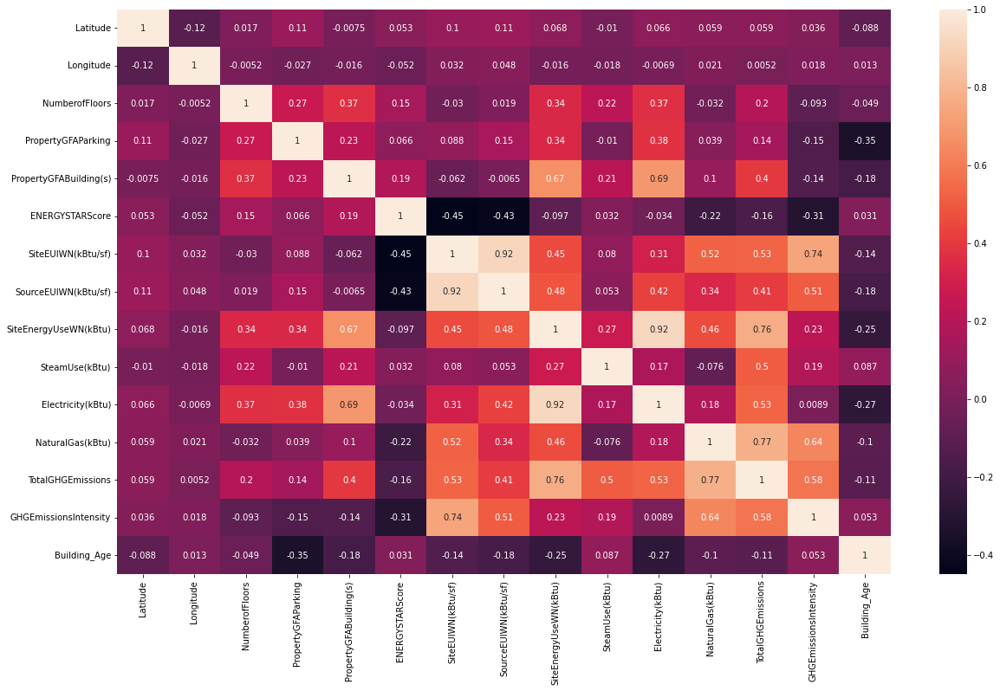

In [141]:
# matrice des correlation
plt.figure(figsize = (20,12))
sns.heatmap(df.corr(), annot = True)
plt.show()

In [142]:
# Lister les colonnes
df.columns

Index(['Latitude', 'Longitude', 'NumberofFloors', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ENERGYSTARScore', 'SiteEUIWN(kBtu/sf)',
       'SourceEUIWN(kBtu/sf)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'TotalGHGEmissions',
       'GHGEmissionsIntensity', 'Building_Age', 'PrimaryPropertyType',
       'Neighborhood', 'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'SecondLargestPropertyUseType', 'ComplianceStatus'],
      dtype='object')

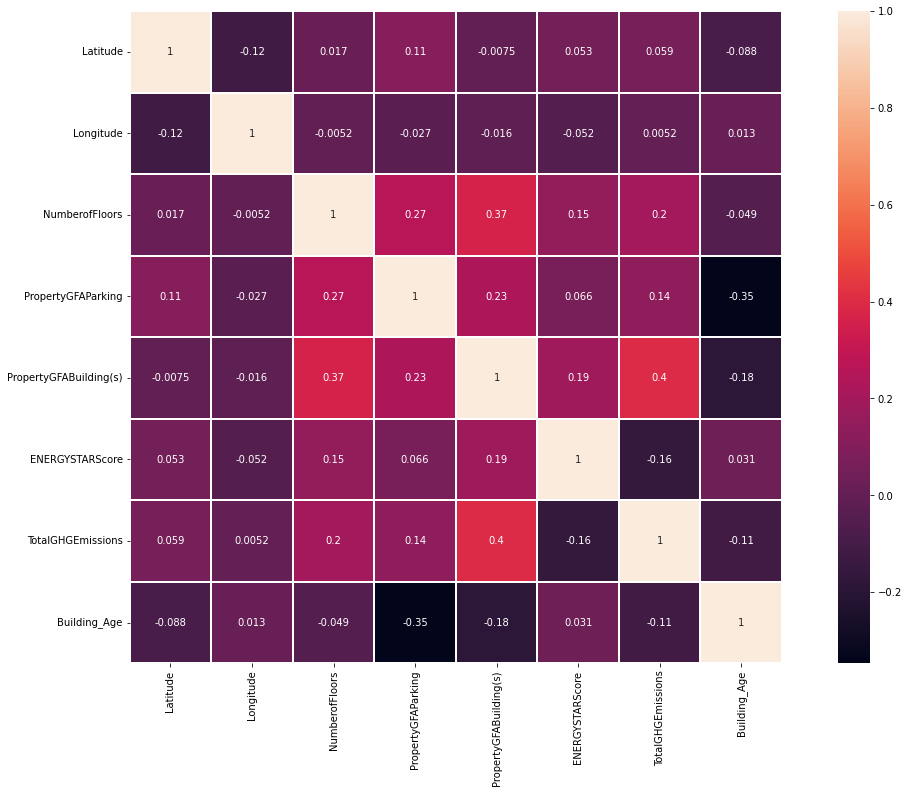

In [143]:
########## FEATURE SELECTION ##########

# https://towardsdatascience.com/feature-selection-correlation-and-p-value-da8921bfb3cf
# How does correlation help in feature selection?
# Features with high correlation are more linearly dependent and hence have almost the same effect on the dependent variable.
# So, when two features have high correlation, we can drop one of the two features.

# risque de multicolinearité si on garde les variables fortement correlées
# 'seuil' pris pour high corr ici = 0.80

# d'après matrice de correlations:
features_to_drop = [
    'SourceEUIWN(kBtu/sf)',
    'SiteEUIWN(kBtu/sf)', # même chose que site energy usewn mais dérivé -> on ne voit pas la corrélation directement avec target emission mais elle existe donc risque de data linkage
    'GHGEmissionsIntensity',
    'NaturalGas(kBtu)',
    'Electricity(kBtu)', # à dropper car risque d'overfitting ?
    'SteamUse(kBtu)', # à dropper car high corr avec target
    'SiteEnergyUseWN(kBtu)' # autre target, à dropper car high corr avec actuelle target
    ]

# premier test en droppant tout
# (puis faire un test en droppant variables une par une pour voir leur effet sur modèle)

df.drop(features_to_drop, axis = 1, inplace = True)

# nouvelle matrice des correlation
plt.figure(figsize = (20, 12))
sns.heatmap(df.corr(), annot = True, linewidths = 0.1, square = True)
plt.show()

# autre option de feature selection à garder en tête = Variance Threshold

## Encoding

In [144]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 833 entries, 0 to 1538
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Latitude                      833 non-null    float64
 1   Longitude                     833 non-null    float64
 2   NumberofFloors                833 non-null    float64
 3   PropertyGFAParking            833 non-null    float64
 4   PropertyGFABuilding(s)        833 non-null    float64
 5   ENERGYSTARScore               833 non-null    float64
 6   TotalGHGEmissions             833 non-null    float64
 7   Building_Age                  833 non-null    float64
 8   PrimaryPropertyType           833 non-null    object 
 9   Neighborhood                  833 non-null    object 
 10  ListOfAllPropertyUseTypes     833 non-null    object 
 11  LargestPropertyUseType        833 non-null    object 
 12  SecondLargestPropertyUseType  833 non-null    object 
 13  Comp

In [145]:
# attention au data linkage

### a) Variables qualitatives

In [146]:
# get dummies -> méthode ok mais on peut mieux faire
# df = pd.get_dummies(data = df, drop_first = True)
# df.head()

# utiliser autoencoder / onehotencoder (equivalent mais en mieux)

In [147]:
df_quali = df.select_dtypes(include = 'object')
df_quali.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 833 entries, 0 to 1538
Data columns (total 6 columns):
 #   Column                        Non-Null Count  Dtype 
---  ------                        --------------  ----- 
 0   PrimaryPropertyType           833 non-null    object
 1   Neighborhood                  833 non-null    object
 2   ListOfAllPropertyUseTypes     833 non-null    object
 3   LargestPropertyUseType        833 non-null    object
 4   SecondLargestPropertyUseType  833 non-null    object
 5   ComplianceStatus              833 non-null    object
dtypes: object(6)
memory usage: 45.6+ KB


In [148]:
df_quali.columns

Index(['PrimaryPropertyType', 'Neighborhood', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'SecondLargestPropertyUseType',
       'ComplianceStatus'],
      dtype='object')

In [149]:
df_quali

,PrimaryPropertyType,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ComplianceStatus
0,Hotel,DOWNTOWN,Hotel,Hotel,Parking,Compliant
1,Hotel,DOWNTOWN,"Hotel, Parking, Restaurant",Hotel,Parking,Compliant
3,Hotel,DOWNTOWN,Hotel,Hotel,Parking,Compliant
4,Hotel,DOWNTOWN,"Hotel, Parking, Swimming Pool",Hotel,Parking,Compliant
5,Other,DOWNTOWN,Police Station,Police Station,Parking,Compliant
...,...,...,...,...,...,...
1524,Mixed Use Property,BALLARD,"Non-Refrigerated Warehouse, Other, Retail Store",Other,Retail Store,Compliant
1525,Warehouse,BALLARD,"Non-Refrigerated Warehouse, Office",Non-Refrigerated Warehouse,Office,Compliant
1526,Warehouse,BALLARD,Non-Refrigerated Warehouse,Non-Refrigerated Warehouse,Parking,Compliant
1534,Other,BALLARD,"Library, Other - Services",Library,Other - Services,Compliant


In [150]:
# SIMPLIFIER

# regarder frequence des modalités de chaque variable qualitative avant de faire le onehotencoder

# si freq < 1% -> remplacer par la modalité la plus fréquente (pour enlever modalités pas pertinentes et "simplifier" le jeu de données)
# 823 entries -> 1% => 8
# si moins de 8 -> on remplace

# tester d'abord avec 1% pour voir ce que ça donne et ensuite tester avec 5% ?

In [151]:
# fonction de simplification des données
def simplify(df, seuil):

    """
    df : dataframe
    seuil : seuil de fréquence pour simplifier les données - entre 0 et 100 (int)

    """

  # calculer frequence en fonction du seuil
    seuil_freq = (df.shape[0] * seuil)/100

  # créer df quali simplifié
    df_simplified = df

  # ajouter boucle sur colonnes
    for col in df.columns:

        # print nom de colonne
        print('----------------------------------------------------')
        print(f'- Colonne {col} : ')
        print('----------------------------------------------------')

        # print nombre de valeurs différentes avant simplification :
        nb_valeurs = df[col].nunique()
        print(f'\n{nb_valeurs} valeurs différentes avant simplification')

        # initier compteur
        count = 0

        # identifier valeur la plus frequente
        mostfreq = df[col].value_counts().index[0] # valeur la plus freq = la 1ère
        frequency = df[col].value_counts()

        # value counts des valeurs
        for i, val in enumerate(frequency):

          # identifier valeurs pour lesquelles on a une freq basse
          if val < seuil_freq:
            label = frequency.index[i]

            # replace par valeur la plus freq
            df_simplified[col].loc[df_simplified[col] == label] = df[col].loc[df[col] == label].replace({x : mostfreq for x in df[col].loc[df[col] == label]})
            count += 1

        # Compter nombre de valeurs remplacées pour la colonne
        print(f'{count} valeurs ont été remplacées')

        # print nombre de valeurs différentes après simplification :
        nb_valeurs = df[col].nunique()
        print(f'{nb_valeurs} valeurs différentes après simplification\n')

    return df_simplified

In [152]:
df_quali_simplified = simplify(df_quali, 1)

----------------------------------------------------
- Colonne PrimaryPropertyType : 
----------------------------------------------------

21 valeurs différentes avant simplification
7 valeurs ont été remplacées
14 valeurs différentes après simplification

----------------------------------------------------
- Colonne Neighborhood : 
----------------------------------------------------

17 valeurs différentes avant simplification
4 valeurs ont été remplacées
13 valeurs différentes après simplification

----------------------------------------------------
- Colonne ListOfAllPropertyUseTypes : 
----------------------------------------------------

241 valeurs différentes avant simplification
223 valeurs ont été remplacées
18 valeurs différentes après simplification

----------------------------------------------------
- Colonne LargestPropertyUseType : 
----------------------------------------------------

49 valeurs différentes avant simplification
34 valeurs ont été remplacées
15 vale

In [153]:
########## ONE HOT ENCODER ##########

# Visualiser df simplifié
print('----------------------------------------------------')
print('df simplifié')
print('----------------------------------------------------')
display(df_quali_simplified.head())

# OneHotEncoder
enc = OneHotEncoder(categories = 'auto')

for col in df_quali_simplified.columns:
  # Convertir type des colonnes en categories
  df_quali_simplified[col] = df_quali_simplified[col].astype('category')

  # Leur assigner des valeurs numériques et créer nouvelles colonnes
  df_quali_simplified[col] = df_quali_simplified[col].cat.codes

# Appliquer l'encoding
feature_arr = enc.fit_transform(df_quali_simplified).toarray()

feature_labels = enc.get_feature_names_out(df_quali.columns)

# Recréer un dataframe avec les données encodées
features = pd.DataFrame(feature_arr, columns = feature_labels)
print('\n----------------------------------------------------')
print('df encodé')
print('----------------------------------------------------')
display(features.head())

----------------------------------------------------
df simplifié
----------------------------------------------------


,PrimaryPropertyType,Neighborhood,ListOfAllPropertyUseTypes,LargestPropertyUseType,SecondLargestPropertyUseType,ComplianceStatus
0,Hotel,DOWNTOWN,Hotel,Hotel,Parking,Compliant
1,Hotel,DOWNTOWN,"Office, Parking",Hotel,Parking,Compliant
3,Hotel,DOWNTOWN,Hotel,Hotel,Parking,Compliant
4,Hotel,DOWNTOWN,"Office, Parking",Hotel,Parking,Compliant
5,Other,DOWNTOWN,"Office, Parking",Office,Parking,Compliant



----------------------------------------------------
df encodé
----------------------------------------------------


,PrimaryPropertyType_0,PrimaryPropertyType_1,PrimaryPropertyType_2,PrimaryPropertyType_3,PrimaryPropertyType_4,PrimaryPropertyType_5,PrimaryPropertyType_6,PrimaryPropertyType_7,PrimaryPropertyType_8,PrimaryPropertyType_9,PrimaryPropertyType_10,PrimaryPropertyType_11,PrimaryPropertyType_12,PrimaryPropertyType_13,Neighborhood_0,Neighborhood_1,Neighborhood_2,Neighborhood_3,Neighborhood_4,Neighborhood_5,Neighborhood_6,Neighborhood_7,Neighborhood_8,Neighborhood_9,Neighborhood_10,Neighborhood_11,Neighborhood_12,ListOfAllPropertyUseTypes_0,ListOfAllPropertyUseTypes_1,ListOfAllPropertyUseTypes_2,ListOfAllPropertyUseTypes_3,ListOfAllPropertyUseTypes_4,ListOfAllPropertyUseTypes_5,ListOfAllPropertyUseTypes_6,ListOfAllPropertyUseTypes_7,ListOfAllPropertyUseTypes_8,ListOfAllPropertyUseTypes_9,ListOfAllPropertyUseTypes_10,ListOfAllPropertyUseTypes_11,ListOfAllPropertyUseTypes_12,ListOfAllPropertyUseTypes_13,ListOfAllPropertyUseTypes_14,ListOfAllPropertyUseTypes_15,ListOfAllPropertyUseTypes_16,ListOfAllPropertyUseTypes_17,LargestPropertyUseType_0,LargestPropertyUseType_1,LargestPropertyUseType_2,LargestPropertyUseType_3,LargestPropertyUseType_4,LargestPropertyUseType_5,LargestPropertyUseType_6,LargestPropertyUseType_7,LargestPropertyUseType_8,LargestPropertyUseType_9,LargestPropertyUseType_10,LargestPropertyUseType_11,LargestPropertyUseType_12,LargestPropertyUseType_13,LargestPropertyUseType_14,SecondLargestPropertyUseType_0,SecondLargestPropertyUseType_1,SecondLargestPropertyUseType_2,SecondLargestPropertyUseType_3,SecondLargestPropertyUseType_4,SecondLargestPropertyUseType_5,SecondLargestPropertyUseType_6,ComplianceStatus_0
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


### b) Variables quantitatives


 Colonne NumberofFloors: 



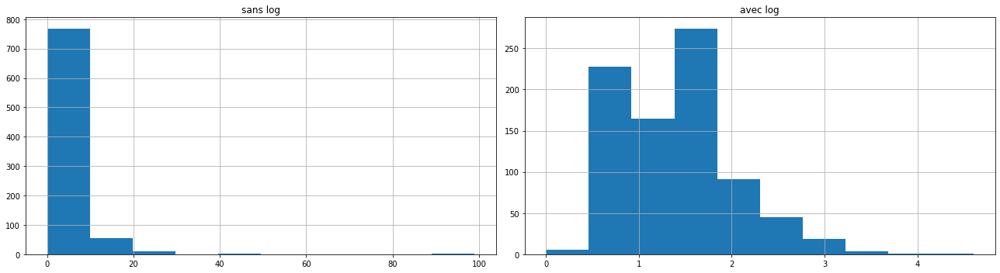


 Colonne PropertyGFAParking: 



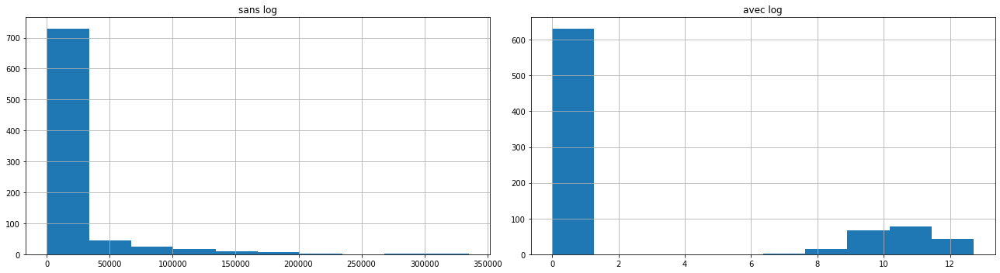


 Colonne PropertyGFABuilding(s): 



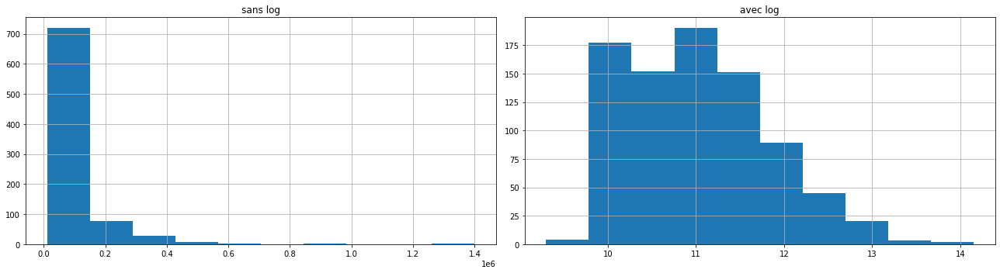


 Colonne ENERGYSTARScore: 



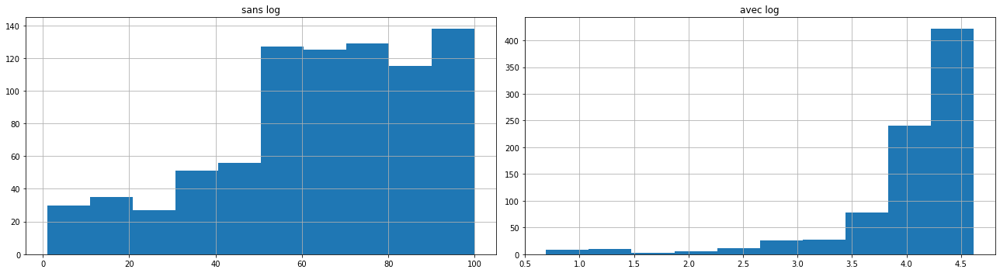


 Colonne TotalGHGEmissions: 



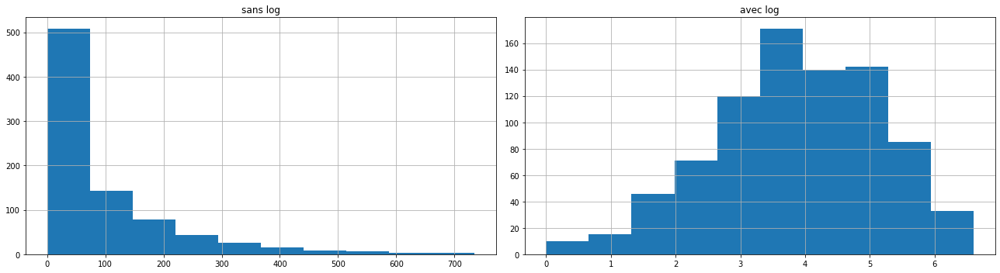


 Colonne Building_Age: 



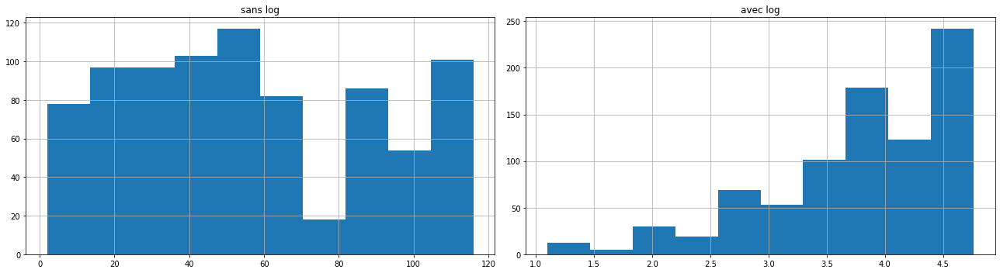

In [154]:
########## VISUALISATION LOG ##########

# Selectionner variables quantitatives uniquement
df_quanti = df.select_dtypes(include = 'float')

# Lister les colonnes qu'on veut visualiser
col = ['NumberofFloors', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ENERGYSTARScore',
       'TotalGHGEmissions', 'Building_Age']

# Visualiser l'effet du log sur chaque variable
for i in col:
    
    print(f'\n Colonne {i}: \n')
    
    # plot valeurs avant log
    plt.figure(figsize = (18, 5))
    plt.subplot(1, 2, 1)
    plt.grid()
    plt.hist(df_quanti[i])
    plt.title('sans log')
    
    # plot valeurs après log
    plt.subplot(1, 2, 2)
    plt.grid()
    plt.hist(np.log(df_quanti[i] + 1))
    plt.title('avec log')
    
    plt.tight_layout()
    plt.show()

In [155]:
########## TRANSFORMATION LOG ##########

# si intervalle de variation n'est pas très grand (tous les points concentrés) -> passer au log pour voir la vraie distribution
# par contre si on voit bien la variation, pas besoin de passer au log

# selectionner colonnes pour lesquelles on va faire le log
col_log = ['NumberofFloors', 'PropertyGFABuilding(s)', 'TotalGHGEmissions']

# appliquer la transformation log: df[log de nom de la variable] = np.log(df[nom de la variable])
for i in col_log:
    df_quanti[i] = np.log(df_quanti[i] + 1) # pour ne pas faire log(0)
    
# Visualiser le résultat
display(df_quanti.head())

,Latitude,Longitude,NumberofFloors,PropertyGFAParking,PropertyGFABuilding(s),ENERGYSTARScore,TotalGHGEmissions,Building_Age
0,47.61220,-122.33799,2.56495,0.0,11.39002,60.0,5.52537,89.0
1,47.61317,-122.33393,2.48491,15064.0,11.39079,61.0,5.69326,20.0
3,47.61412,-122.33664,2.39790,0.0,11.02388,56.0,5.66098,90.0
4,47.61375,-122.34047,2.94444,62000.0,11.64027,75.0,6.22656,36.0
5,47.61623,-122.33657,1.09861,37198.0,11.00362,56.3,5.71311,17.0


In [156]:
########## CONCATENATION ##########
# concatener données qualitatives et quantitatives transformées

features = features.reset_index()
df_quanti = df_quanti.reset_index()

df = pd.concat([features, df_quanti], axis = 1)
df.head()

,index,PrimaryPropertyType_0,PrimaryPropertyType_1,PrimaryPropertyType_2,PrimaryPropertyType_3,PrimaryPropertyType_4,PrimaryPropertyType_5,PrimaryPropertyType_6,PrimaryPropertyType_7,PrimaryPropertyType_8,PrimaryPropertyType_9,PrimaryPropertyType_10,PrimaryPropertyType_11,PrimaryPropertyType_12,PrimaryPropertyType_13,Neighborhood_0,Neighborhood_1,Neighborhood_2,Neighborhood_3,Neighborhood_4,Neighborhood_5,Neighborhood_6,Neighborhood_7,Neighborhood_8,Neighborhood_9,Neighborhood_10,Neighborhood_11,Neighborhood_12,ListOfAllPropertyUseTypes_0,ListOfAllPropertyUseTypes_1,ListOfAllPropertyUseTypes_2,ListOfAllPropertyUseTypes_3,ListOfAllPropertyUseTypes_4,ListOfAllPropertyUseTypes_5,ListOfAllPropertyUseTypes_6,ListOfAllPropertyUseTypes_7,ListOfAllPropertyUseTypes_8,ListOfAllPropertyUseTypes_9,ListOfAllPropertyUseTypes_10,ListOfAllPropertyUseTypes_11,ListOfAllPropertyUseTypes_12,ListOfAllPropertyUseTypes_13,ListOfAllPropertyUseTypes_14,ListOfAllPropertyUseTypes_15,ListOfAllPropertyUseTypes_16,ListOfAllPropertyUseTypes_17,LargestPropertyUseType_0,LargestPropertyUseType_1,LargestPropertyUseType_2,LargestPropertyUseType_3,LargestPropertyUseType_4,LargestPropertyUseType_5,LargestPropertyUseType_6,LargestPropertyUseType_7,LargestPropertyUseType_8,LargestPropertyUseType_9,LargestPropertyUseType_10,LargestPropertyUseType_11,LargestPropertyUseType_12,LargestPropertyUseType_13,LargestPropertyUseType_14,SecondLargestPropertyUseType_0,SecondLargestPropertyUseType_1,SecondLargestPropertyUseType_2,SecondLargestPropertyUseType_3,SecondLargestPropertyUseType_4,SecondLargestPropertyUseType_5,SecondLargestPropertyUseType_6,ComplianceStatus_0,index,Latitude,Longitude,NumberofFloors,PropertyGFAParking,PropertyGFABuilding(s),ENERGYSTARScore,TotalGHGEmissions,Building_Age
0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0,47.61220,-122.33799,2.56495,0.0,11.39002,60.0,5.52537,89.0
1,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1,47.61317,-122.33393,2.48491,15064.0,11.39079,61.0,5.69326,20.0
2,2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,3,47.61412,-122.33664,2.39790,0.0,11.02388,56.0,5.66098,90.0
3,3,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,4,47.61375,-122.34047,2.94444,62000.0,11.64027,75.0,6.22656,36.0
4,4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,5,47.61623,-122.33657,1.09861,37198.0,11.00362,56.3,5.71311,17.0


In [157]:
########## EVALUATION ##########
# créer listes pour storer les scores au fur et à mesure

model = [] # nom du modèle
default_best = [] # default ou best
temps_execution = [] # temps d'execution
score_mae = [] # mae
score_mse = [] # mse
score_rmse = [] # rmse
score_r2_train = [] # r2
score_r2_test = [] # r2

In [158]:
########## EVALUATION ##########

def model_evaluation(model_name, model_type, y_train, y_test, y_predtrain, y_predtest, temps):
    
    """
    model_name : nom du modèle à évaluer
    model, model_type, temps_execution, score_mse, score_rmse, score_r2 : listes pour ajouter les valeurs

    """
    global model, default_best, temps_execution, score_mae, score_mse, score_rmse, score_r2_train, score_r2_test
    
    # Nom du modèle
    model.append(model_name)
    
    # 'Type' (Default ou Best)
    default_best.append(model_type)

    # Temps d'execution (s)
    temps_execution.append(round(temps, 3))
    
    # MAE
    # mae = Mean absolute error
    # moyenne arithmétique des valeurs absolues des écarts
    mae = mean_absolute_error(y_test, y_predtest)
    score_mae.append(round(mae, 2))

    # MSE
    # mse = moyenne arithmétique des carrés des écarts entre prévisions du modèle et observations
    # but = minimiser cette valeur dans le cadre d'une régression
    mse = mean_squared_error(y_test, y_predtest)
    score_mse.append(round(mse, 2))

    # RMSE
    # rmse = erreur quadratique moyenne = écart-type des résidus (erreurs de prévision)
    # à interpreter en reliant avec variance des données
    rmse = np.sqrt(mse)
    score_rmse.append(round(rmse, 2))

    # R2 
    # coefficient de détermination 
    # explique dans quelle mesure la variance totale de la variable dépendante peut être réduite en utilisant 
    # la régression des moindres carrés
    r2_train = r2_score(y_train, y_predtrain)
    r2_test = r2_score(y_test, y_predtest)
    score_r2_train.append(round(r2_train, 2))
    score_r2_test.append(round(r2_test, 2))

    # si rmse très faible et r2 quasi égal à 1 -> surement signe de data linkage

## Avec energy star score 

### Data preparation

In [159]:
########## TARGET ##########

# Separating features X and labels y

# target = consommation en energie
# (seconde target = SiteEnergyUseWN(kBtu) -> cf autre notebook)

X = df.drop(['TotalGHGEmissions', 'index'], axis = 1)
y = df['TotalGHGEmissions']

In [160]:
########## DATA SCALING ##########

#It exists many methods to scale your data but the most popular are:
#- StandardScaler: standardizes features by removing the mean and dividing by the Standard Deviation.
#- MinMaxScaler: standardizes features such that it is in a given range ([0-1] per default). For each feature, it removes XMin_feature and divides by (XMax_feature - XMin_feature)
#- Normalize (with L2 norm): scales samples individually to unit L2 norm.

# Initier le scaler
scaler = StandardScaler()

# scaler variables
scaler.fit(X, y)
X_scaled = scaler.transform(X)

In [161]:
########## TRAIN TEST SPLIT ##########
# Separer les données en un train_set et un test_set

X_train, X_test, y_train, y_test = train_test_split(X_scaled, 
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 10) # pour 'contrôler' le mélange aléatoire des données avant le split

print("Le dataset d'entraînement contient {} lignes".format(len(X_train)))
print("Le dataset de test contient {} lignes".format(len(X_test)))

Le dataset d'entraînement contient 583 lignes
Le dataset de test contient 250 lignes


In [162]:
########## CROSS VALIDATION ##########

# -> consiste à entrainer puis valider notre modèle sur plusieurs découpes possibles du train set
# cv = nombre de splits (de découpes) qu'on veut dans notre cross validation
# prendre nombre impair comme ça on est sûrs d'avoir une réponse (et non un résultat ex aequo)

# ici on fera la validation via la grid search

### Modèle 1 - Regression linéaire

In [163]:
########## Linear Regression Default Params ##########

# début de l'execution
start = time.time()

# Instancier le modèle
lr = LinearRegression()

# Entrainer le modèle
lr.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Score
print(f'Coefficient de détermination (R2) = {lr.score(X_test, y_test)}')

# Predire
y_pred_test_default = lr.predict(X_test)
y_pred_train_default = lr.predict(X_train)

Coefficient de détermination (R2) = 0.1310755813104193


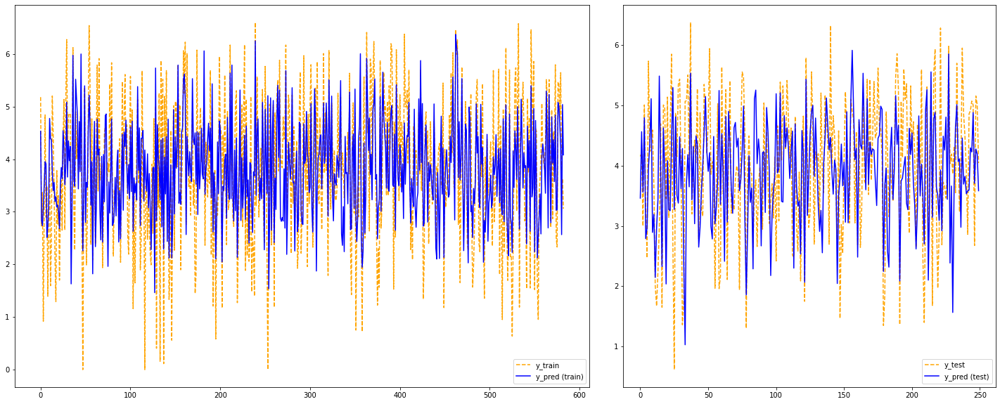

In [164]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred (train)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred (test)')
plt.legend(loc = 'best')

plt.show()

In [165]:
########## EVALUATION ##########

model_evaluation(model_name = 'Linear regression', 
                 model_type = 'Default', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_default, 
                 y_predtest = y_pred_test_default, 
                 temps = temps)

In [166]:
%%time

########## GRIDSEARCH CV ##########
# -> construit une grille de modèles avec toutes les combinaisons d'hyperparamètres présents dans "param_grid"

# début de l'execution
start = time.time()

# Modèle
lr = LinearRegression()

# Hyperparamètres et valeurs à tester
param_grid = {'fit_intercept': [True, False], # default = True
              'copy_X': [True, False], # default = True
              'n_jobs' : [1, 2, 3, 4, 5, None], # default = None
              'positive': [True, False] # default = False
             }

# Grid Search CV
grid = GridSearchCV(lr,
                    param_grid,
                    scoring = 'neg_mean_squared_error',
                    cv = 5,
                    verbose = 1,
                    n_jobs = -1
                   )

# On entraîne la grille 
grid.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Meilleur score obtenu: best_score_
print(f'\nBest score = {grid.best_score_}')

# Optimal hyperparameters: best_params_
display(grid.best_params_)

# Sauvegarder le meilleur modèle
best_lr = grid.best_estimator_

# Tester le meilleur modèle sur données test
print(f'Coefficient de détermination (R2) = {best_lr.score(X_test, y_test)}\n')

# Predire
y_pred_test_best = best_lr.predict(X_test)
y_pred_train_best = best_lr.predict(X_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits

Best score = -1.5603178600144505


{'copy_X': True, 'fit_intercept': True, 'n_jobs': 1, 'positive': True}

Coefficient de détermination (R2) = 0.12941238196767058

CPU times: user 560 ms, sys: 153 ms, total: 712 ms
Wall time: 1.86 s


Quantités de données à utiliser pour l'entrainement (10 lots): [ 93 134 176 217 258 300 341 383 424 466]


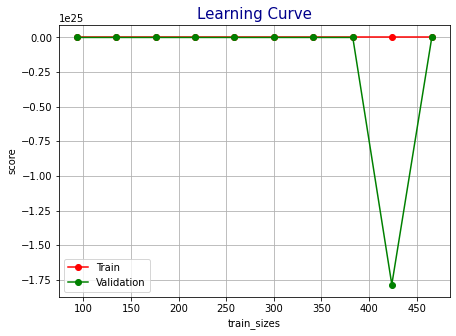

In [167]:
# Courbe d'apprentissage (learning curve)
# montre l'évolution des performances du modèle en fonction de la quantité de données qu'on lui fournit

N, train_score, val_score = learning_curve(best_lr, X_train, y_train, train_sizes = np.linspace(0.2, 1.0, 10), cv = 5)

# Train sizes
print(f"Quantités de données à utiliser pour l'entrainement (10 lots): {N}")

# Learning curve
plt.figure(figsize = (7, 5))
plt.grid()
plt.plot(N, train_score.mean(axis = 1), 'o-', color = 'r', label = 'Train')
plt.plot(N, val_score.mean(axis = 1), 'o-', color  = 'g', label = 'Validation')
plt.title ('Learning Curve', fontsize = 15, color = 'darkblue')
plt.legend(loc = 'best')
plt.xlabel('train_sizes')
plt.ylabel('score')
plt.show()

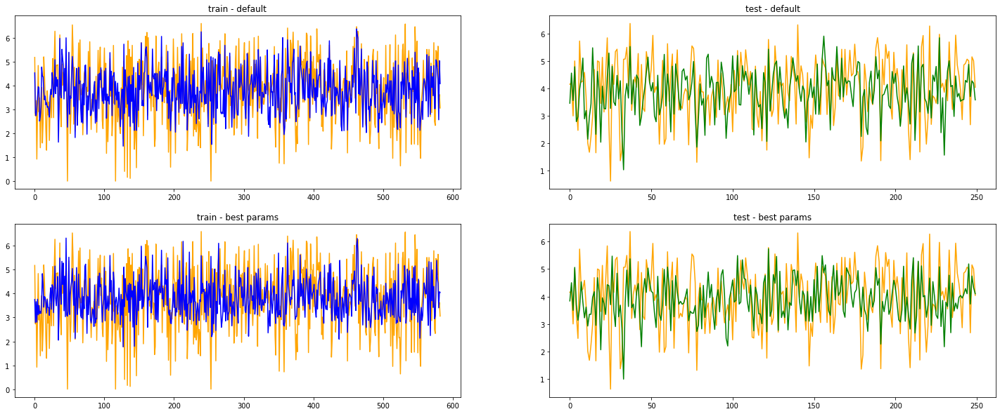

In [168]:
# Plot prédictions

plt.figure(figsize = (25, 10))
plt.subplot(2, 2, 1)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_default, color = 'blue')
plt.title('train - default')
plt.subplot(2, 2, 2)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_default, color = 'green')
plt.title('test - default')
plt.subplot(2, 2, 3)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_best, color = 'blue')
plt.title('train - best params')
plt.subplot(2, 2, 4)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_best, color = 'green')
plt.title('test - best params')

plt.show()

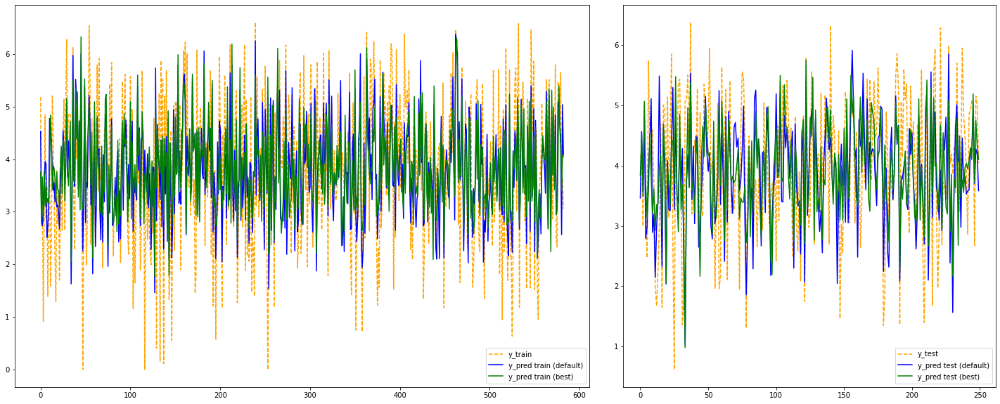

In [169]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred train (default)')
ax1.plot(y_pred_train_best, color = 'green', label = 'y_pred train (best)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred test (default)')
ax2.plot(y_pred_test_best, color = 'green', label = 'y_pred test (best)')
plt.legend(loc = 'best')

plt.show()

In [170]:
########## EVALUATION ##########

model_evaluation(model_name = 'Linear regression', 
                 model_type = 'Best', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_best, 
                 y_predtest = y_pred_test_best, 
                 temps = temps)

### Modèle 2 - KNeighborsRegressor

In [171]:
########## KNN Default Params ##########

# début de l'execution
start = time.time()

# Instancier le modèle
knn = KNeighborsRegressor()

# Entrainer le modèle
knn.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Score
print(f'Coefficient de détermination (R2) = {knn.score(X_test, y_test)}')

# Predire
y_pred_test_default = knn.predict(X_test)
y_pred_train_default = knn.predict(X_train)

Coefficient de détermination (R2) = -0.09135098688414378


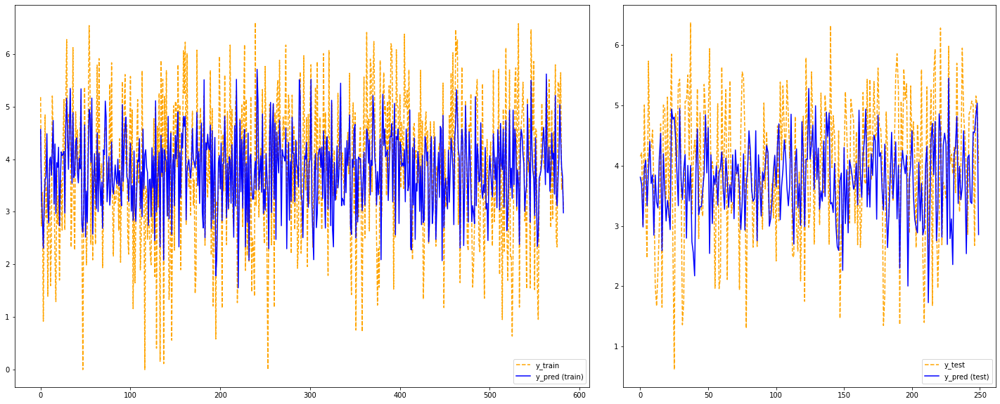

In [172]:
# Plot prédictions 

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred (train)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred (test)')
plt.legend(loc = 'best')

plt.show()

In [173]:
########## EVALUATION ##########

model_evaluation(model_name = 'KNN', 
                 model_type = 'Default', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_default, 
                 y_predtest = y_pred_test_default, 
                 temps = temps)

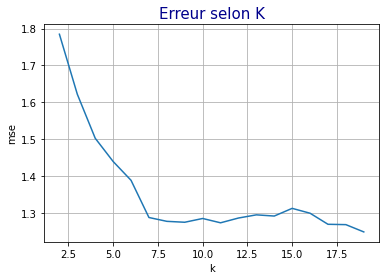

In [174]:
# Compute error according to K

k_value = []
MSE = []
for i in range(2, 20):
    k_value.append(i)
    knn = KNeighborsRegressor(n_neighbors = i)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_test)
    knn_mse = mean_squared_error(y_test, y_pred)
    MSE.append(knn_mse)

plt.figure()
plt.grid()
plt.plot(k_value, MSE)
plt.title ('Erreur selon K', fontsize = 15, color = 'darkblue')
plt.xlabel('k')
plt.ylabel('mse')
plt.show()

In [175]:
%%time

########## GRIDSEARCH CV ##########

# début de l'execution
start = time.time()

# Modèle
knn = KNeighborsRegressor()

# Paramètres
# avec algo et leaf size -> plus de 7h

param_grid = [{
    'n_neighbors': list(range(1, 51)), # default = 5
    'weights': ['uniform', 'distance'], # default = ’uniform’
    #'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'], # default = ’auto’
    #'leaf_size' : list(range(20, 41)), # default = 30
    'p' : [1, 2, 3, 4, 5], # default = 2
    'metric': ['euclidean', 'manhattan', 'minkowski'], # default = ’minkowski’
    'n_jobs' : [1, 2, 3, 4, 5] # default = None
}]

# Grid Search CV
grid = GridSearchCV(knn,
                    param_grid,
                    scoring = 'neg_mean_squared_error',
                    cv = 5,
                    verbose = 1,
                    n_jobs = -1
                   )

# On entraîne la grille 
grid.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Meilleur score obtenu: best_score_
print(f'\nBest score = {grid.best_score_}')

# Optimal hyperparameters: best_params_
display(grid.best_params_)

# Sauvegarder le meilleur modèle
best_knn = grid.best_estimator_

# Tester le meilleur modèle sur données test
print(f'Coefficient de détermination (R2) = {best_knn.score(X_test, y_test)}\n')

# Predire
y_pred_test_best = best_knn.predict(X_test)
y_pred_train_best = best_knn.predict(X_train)

Fitting 5 folds for each of 7500 candidates, totalling 37500 fits

Best score = -1.5555847521119197


{'metric': 'manhattan',
 'n_jobs': 1,
 'n_neighbors': 41,
 'p': 1,
 'weights': 'distance'}

Coefficient de détermination (R2) = 0.11718118098937502

CPU times: user 4.65 s, sys: 481 ms, total: 5.13 s
Wall time: 54 s


Quantités de données à utiliser pour l'entrainement (10 lots): [ 93 134 176 217 258 300 341 383 424 466]


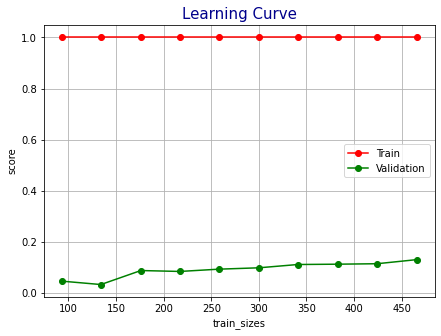

In [176]:
# Courbe d'apprentissage (learning curve)
# montre l'évolution des performances du modèle en fonction de la quantité de données qu'on lui fournit

N, train_score, val_score = learning_curve(best_knn, X_train, y_train, train_sizes = np.linspace(0.2, 1.0, 10), cv = 5)

# Train sizes
print(f"Quantités de données à utiliser pour l'entrainement (10 lots): {N}")

# Learning curve
plt.figure(figsize = (7,5))
plt.grid()
plt.plot(N, train_score.mean(axis = 1), 'o-', color = 'r', label = 'Train')
plt.plot(N, val_score.mean(axis = 1), 'o-', color  = 'g', label = 'Validation')
plt.title ('Learning Curve', fontsize = 15, color = 'darkblue')
plt.legend(loc = 'best')
plt.xlabel('train_sizes')
plt.ylabel('score')
plt.show()

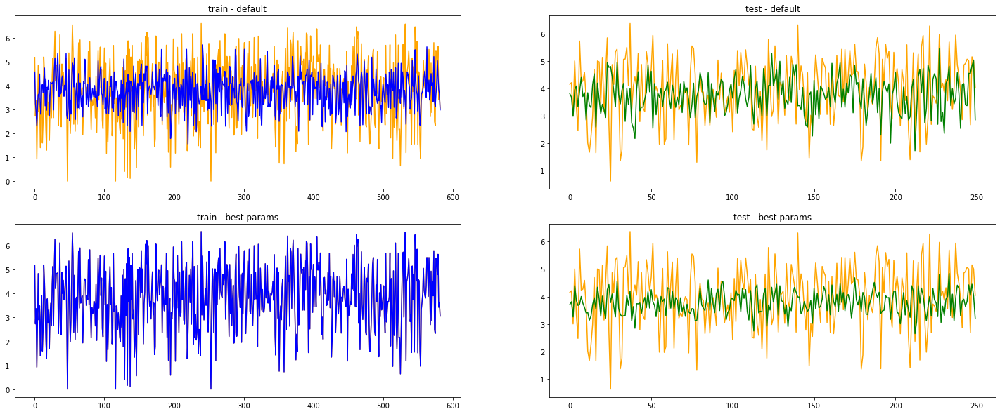

In [177]:
# Plot prédictions

plt.figure(figsize = (25, 10))
plt.subplot(2, 2, 1)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_default, color = 'blue')
plt.title('train - default')
plt.subplot(2, 2, 2)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_default, color = 'green')
plt.title('test - default')
plt.subplot(2, 2, 3)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_best, color = 'blue')
plt.title('train - best params')
plt.subplot(2, 2, 4)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_best, color = 'green')
plt.title('test - best params')

plt.show()

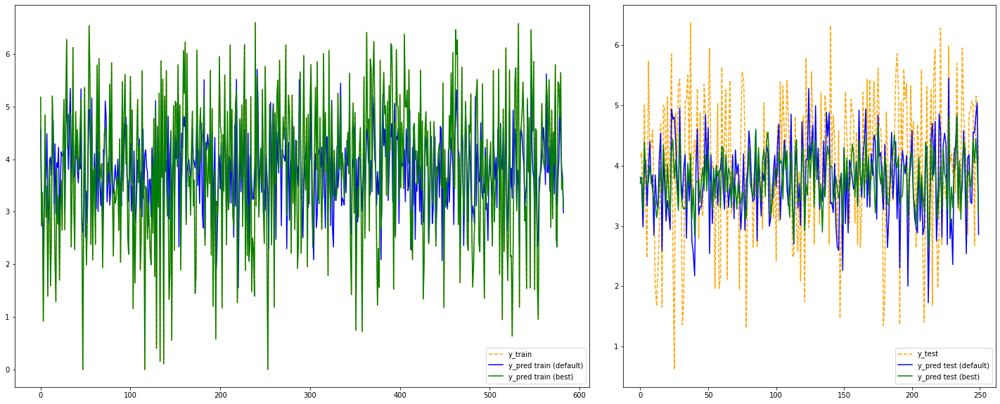

In [178]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred train (default)')
ax1.plot(y_pred_train_best, color = 'green', label = 'y_pred train (best)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred test (default)')
ax2.plot(y_pred_test_best, color = 'green', label = 'y_pred test (best)')
plt.legend(loc = 'best')

plt.show()

In [179]:
########## EVALUATION ##########

model_evaluation(model_name = 'KNN', 
                 model_type = 'Best', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_best, 
                 y_predtest = y_pred_test_best, 
                 temps = temps)

### Modèle 3 - Support Vector Machine Regressor

In [180]:
########## SVR Default Params ##########

# début de l'execution
start = time.time()

# Instancier le modèle
svr = SVR()

# Entrainer le modèle
svr.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Score
print(f'Coefficient de détermination (R2) = {svr.score(X_test, y_test)}')

# Predire
y_pred_test_default = svr.predict(X_test)
y_pred_train_default = svr.predict(X_train)

Coefficient de détermination (R2) = 0.1680663458922551


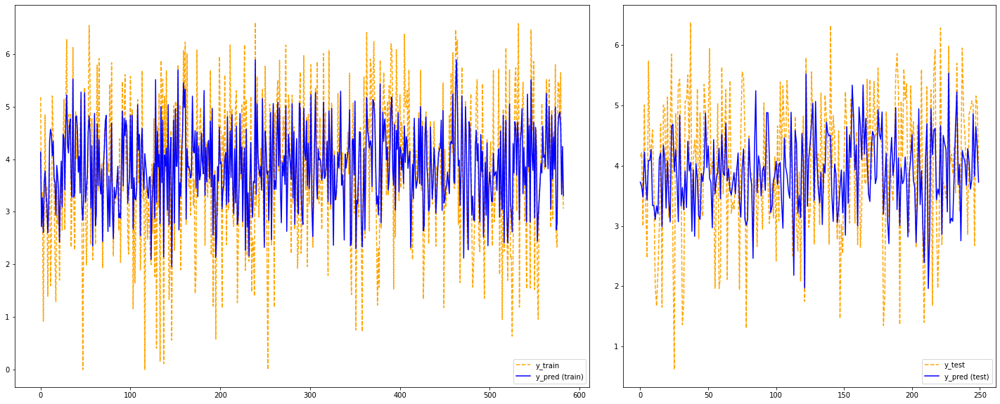

In [181]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred (train)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred (test)')
plt.legend(loc = 'best')

plt.show()

In [182]:
########## EVALUATION ##########

model_evaluation(model_name = 'SVR', 
                 model_type = 'Default', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_default, 
                 y_predtest = y_pred_test_default, 
                 temps = temps)

In [183]:
%%time

########## GRIDSEARCH CV ##########

# début de l'execution
start = time.time()

# Modèle
svr = SVR()

# Paramètres
param_grid = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], # default = ’rbf’
    'C': [1, 5, 10], # default = 1.0
    'gamma': ['auto', 'scale'], # default = ’scale’
    'epsilon': [0, 0.01, 0.1, 0.2, 0.5, 1, 2], # default = 0.1
    'shrinking': [True, False], # default = True
    'max_iter' : [-1, 10, 100, 1000] #default = -1
}

# Grid Search CV
grid = GridSearchCV(svr, 
                    param_grid,
                    scoring = 'neg_mean_squared_error',
                    cv = 5,
                    verbose = 1,
                    n_jobs = -1
                   )

# On entraîne la grille 
grid.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Meilleur score obtenu: best_score_
print(f'Best score = {grid.best_score_}')

# Optimal hyperparameters: best_params_
display(grid.best_params_) 

# Sauvegarder le meilleur modèle
best_svr = grid.best_estimator_

# Tester le meilleur modèle sur données test
print(f'Coefficient de détermination (R2) = {best_svr.score(X_test, y_test)}\n')

# Predire
y_pred_test_best = best_svr.predict(X_test)
y_pred_train_best = best_svr.predict(X_train)

Fitting 5 folds for each of 1344 candidates, totalling 6720 fits


/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luci

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lu

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luci

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luci

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luci

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

Best score = -1.2940497550906944


{'C': 1,
 'epsilon': 1,
 'gamma': 'scale',
 'kernel': 'sigmoid',
 'max_iter': 100,
 'shrinking': True}

Coefficient de détermination (R2) = 0.2329792204526311

CPU times: user 2.91 s, sys: 423 ms, total: 3.34 s
Wall time: 1min 15s


Quantités de données à utiliser pour l'entrainement (10 lots): [ 93 134 176 217 258 300 341 383 424 466]


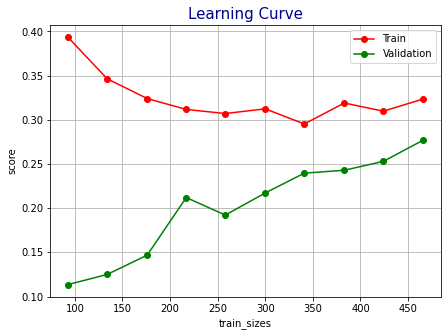

In [184]:
# Courbe d'apprentissage (learning curve)
# montre l'évolution des performances du modèle en fonction de la quantité de données qu'on lui fournit

N, train_score, val_score = learning_curve(best_svr, X_train, y_train, train_sizes = np.linspace(0.2, 1.0, 10), cv = 5)

# Train sizes
print(f"Quantités de données à utiliser pour l'entrainement (10 lots): {N}")

# Learning curve
plt.figure(figsize = (7,5))
plt.grid()
plt.plot(N, train_score.mean(axis = 1), 'o-', color = 'r', label = 'Train')
plt.plot(N, val_score.mean(axis = 1), 'o-', color  = 'g', label = 'Validation')
plt.title ('Learning Curve', fontsize = 15, color = 'darkblue')
plt.legend(loc = 'best')
plt.xlabel('train_sizes')
plt.ylabel('score')
plt.show()

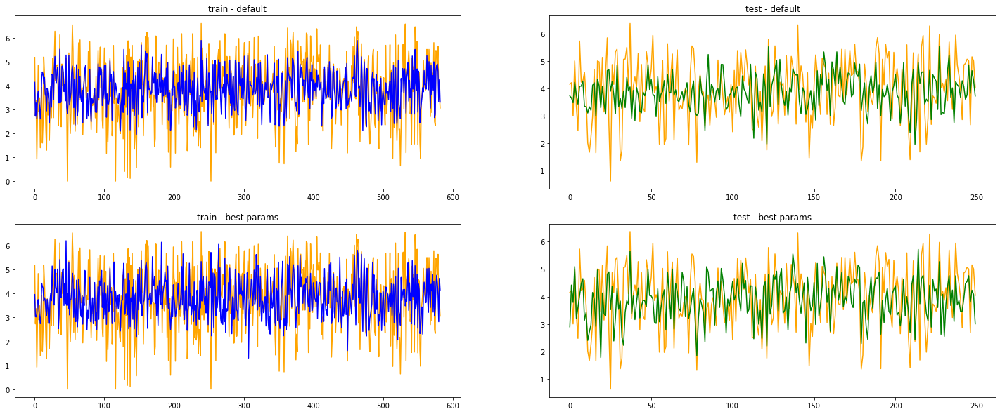

In [185]:
# Plot prédictions

plt.figure(figsize = (25, 10))
plt.subplot(2, 2, 1)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_default, color = 'blue')
plt.title('train - default')
plt.subplot(2, 2, 2)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_default, color = 'green')
plt.title('test - default')
plt.subplot(2, 2, 3)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_best, color = 'blue')
plt.title('train - best params')
plt.subplot(2, 2, 4)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_best, color = 'green')
plt.title('test - best params')

plt.show()

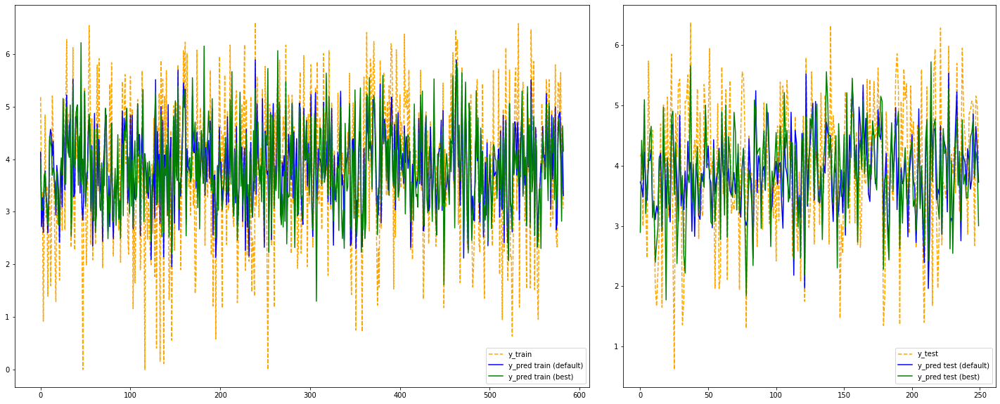

In [186]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred train (default)')
ax1.plot(y_pred_train_best, color = 'green', label = 'y_pred train (best)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred test (default)')
ax2.plot(y_pred_test_best, color = 'green', label = 'y_pred test (best)')
plt.legend(loc = 'best')

plt.show()

In [187]:
########## EVALUATION ##########

model_evaluation(model_name = 'SVR', 
                 model_type = 'Best', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_best, 
                 y_predtest = y_pred_test_best, 
                 temps = temps)

### Modèle 4 - Random Forest Regressor

In [188]:
########## Random Forest Regressor Default Params ##########

# début de l'execution
start = time.time()

# Instancier le modèle
forest = RandomForestRegressor()

# Entrainer le modèle
forest.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Score
print(f'Coefficient de détermination (R2) = {forest.score(X_test, y_test)}')

# Predire
y_pred_test_default = forest.predict(X_test)
y_pred_train_default = forest.predict(X_train)

Coefficient de détermination (R2) = 0.18466700690232996


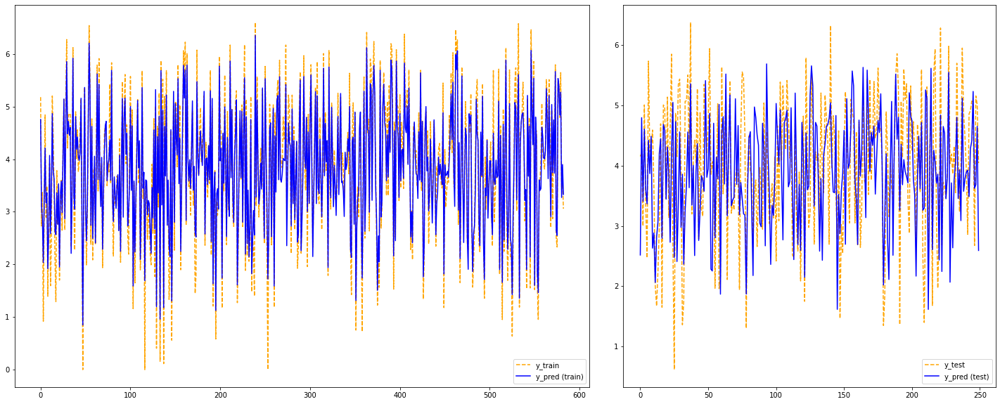

In [189]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred (train)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred (test)')
plt.legend(loc = 'best')

plt.show()

In [190]:
########## EVALUATION ##########

model_evaluation(model_name = 'Random Forest Regressor', 
                 model_type = 'Default', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_default, 
                 y_predtest = y_pred_test_default, 
                 temps = temps)

In [191]:
%%time

########## GRIDSEARCH CV ##########

start = time.time()

# Modèle
forest = RandomForestRegressor()

# Paramètres
param_grid = [
    {'n_estimators': [5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100], # default = 100
     #'criterion' : ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'], # default = ”squared_error”
     'max_depth' : [5, 10, 15, 25, 50, None], # default = None
     'min_samples_split' : [2, 5, 10], # default = 2
     #'min_weight_fraction_leaf' : [0.0], # default = 0.0
     'max_features': ['auto', 'sqrt', 'log2', None], # default = 1.0
     #'max_leaf_nodes': [None], # default = None
     #'min_impurity_decrease': [0.0], # default = 0.0
     'bootstrap': [True, False], # default = True
     #'oob_score': [False], # default = False - pas assez d'arbres pour avoir un OOB score fiable
     #'n_jobs': [None], # default = None
     #'random_state': [None], # default = None
     #'warm_start': [True, False], # default = False
     #'ccp_alpha': [0.0], # default = 0.0
     #'max_samples': [None] # default = None
  }]

# Grid search CV
grid = GridSearchCV(forest, 
                    param_grid,
                    scoring = 'neg_mean_squared_error',
                    cv = 5,
                    verbose = 1,
                    n_jobs = -1
                   )

# On entraîne la grille 
grid.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Meilleur score obtenu: best_score_
print(f'\nBest score = {grid.best_score_}')

# Optimal hyperparameters: best_params_
display(grid.best_params_) 

# Sauvegarder le meilleur modèle
best_forest = grid.best_estimator_

# Tester le meilleur modèle sur données test
print(f'Coefficient de détermination (R2) = {best_forest.score(X_test, y_test)}\n')

# Predire
y_pred_test_best = best_forest.predict(X_test)
y_pred_train_best = best_forest.predict(X_train)

Fitting 5 folds for each of 2736 candidates, totalling 13680 fits

Best score = -1.139182833416935


{'bootstrap': True,
 'max_depth': 5,
 'max_features': 'auto',
 'min_samples_split': 5,
 'n_estimators': 20}

Coefficient de détermination (R2) = 0.19821725078193408

CPU times: user 6.63 s, sys: 803 ms, total: 7.43 s
Wall time: 1min 53s


Quantités de données à utiliser pour l'entrainement (10 lots): [ 93 134 176 217 258 300 341 383 424 466]


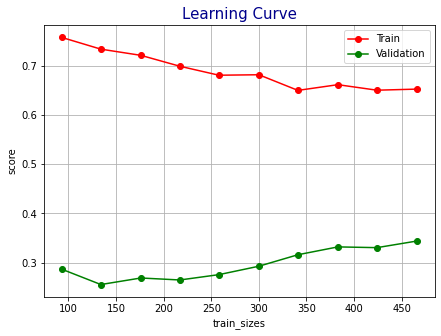

In [192]:
# Courbe d'apprentissage (learning curve)
# montre l'évolution des performances du modèle en fonction de la quantité de données qu'on lui fournit

N, train_score, val_score = learning_curve(best_forest, X_train, y_train, train_sizes = np.linspace(0.2, 1.0, 10), cv = 5)

# Train sizes
print(f"Quantités de données à utiliser pour l'entrainement (10 lots): {N}")

# Learning curve
plt.figure(figsize = (7,5))
plt.grid()
plt.plot(N, train_score.mean(axis = 1), 'o-', color = 'r', label = 'Train')
plt.plot(N, val_score.mean(axis = 1), 'o-', color  = 'g', label = 'Validation')
plt.title ('Learning Curve', fontsize = 15, color = 'darkblue')
plt.legend(loc = 'best')
plt.xlabel('train_sizes')
plt.ylabel('score')
plt.show()

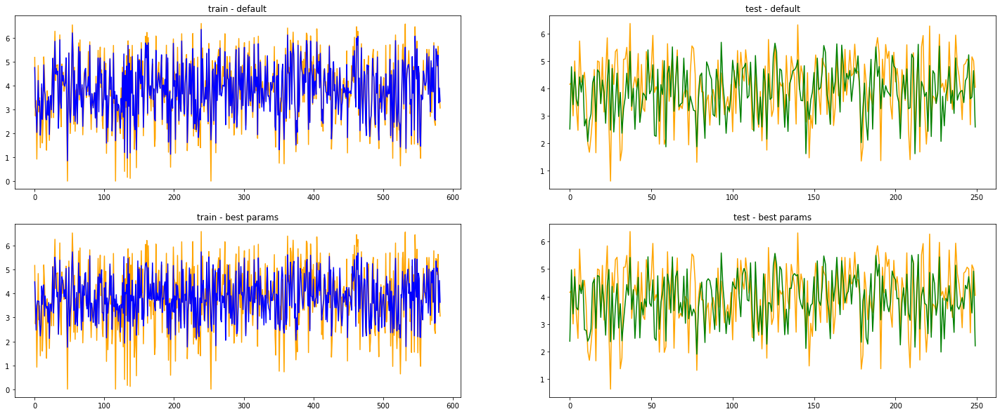

In [193]:
# Plot prédictions

plt.figure(figsize = (25, 10))
plt.subplot(2, 2, 1)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_default, color = 'blue')
plt.title('train - default')
plt.subplot(2, 2, 2)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_default, color = 'green')
plt.title('test - default')
plt.subplot(2, 2, 3)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_best, color = 'blue')
plt.title('train - best params')
plt.subplot(2, 2, 4)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_best, color = 'green')
plt.title('test - best params')

plt.show()

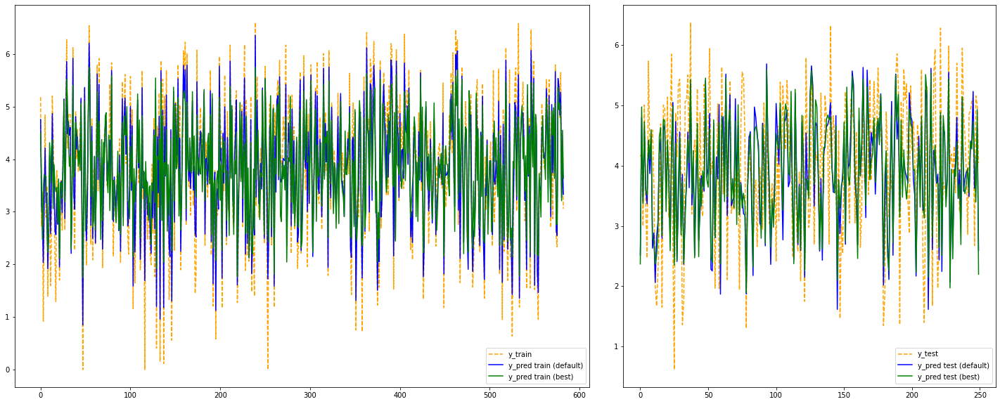

In [194]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred train (default)')
ax1.plot(y_pred_train_best, color = 'green', label = 'y_pred train (best)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred test (default)')
ax2.plot(y_pred_test_best, color = 'green', label = 'y_pred test (best)')
plt.legend(loc = 'best')

plt.show()

In [195]:
########## EVALUATION ##########

model_evaluation(model_name = 'Random Forest Regressor', 
                 model_type = 'Best', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_best, 
                 y_predtest = y_pred_test_best, 
                 temps = temps)

### Modèle 5 - Gradient Boosting Regressor

In [196]:
########## XGBoost Default Params ##########

# début de l'execution
start = time.time()

# Instancier le modèle
boost = GradientBoostingRegressor()

# Entrainer le modèle
boost.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Score
print(f'Coefficient de détermination (R2) = {boost.score(X_test, y_test)}')

# Predire
y_pred_test_default = boost.predict(X_test)
y_pred_train_default = boost.predict(X_train)

Coefficient de détermination (R2) = 0.2399039876213025


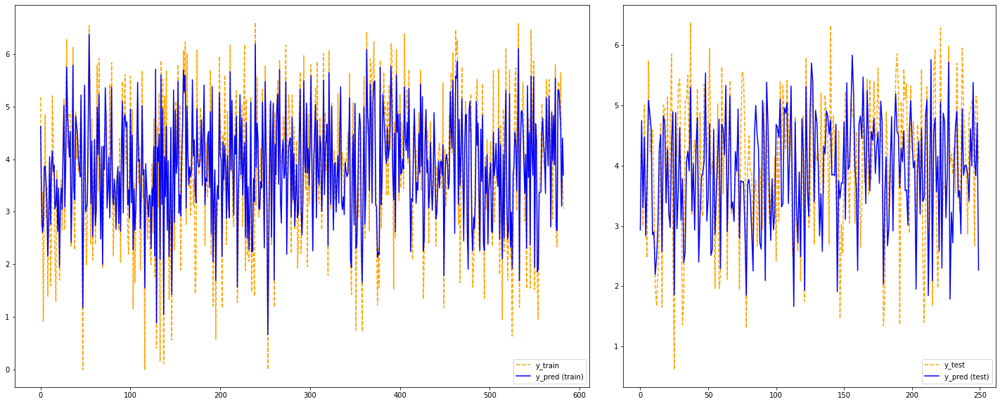

In [197]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred (train)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred (test)')
plt.legend(loc = 'best')

plt.show()

In [198]:
########## EVALUATION ##########

model_evaluation(model_name = 'Gradient Boosting Regressor', 
                 model_type = 'Default', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_default, 
                 y_predtest = y_pred_test_default, 
                 temps = temps)

In [201]:
%%time

########## GRIDSEARCH CV ##########

# début de l'execution
start = time.time()
time_debut = datetime.now()
time_debut_convert = time_debut.strftime('%H:%M:%S')
print(f'Début : {time_debut_convert}\n')

param_grid = {'n_estimators': [25, 50, 100, 200, 500, 1000], # default = 100
              'max_depth': [None, 1, 2, 3, 4, 6, 10, 15, 20], # default = 3
              'min_samples_split': [2, 3, 4, 5], # default = 2
              'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.3], # default = 0.1
              'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'] # default = 'squared_error'
             }

grid = GridSearchCV(GradientBoostingRegressor(),
                    param_grid,
                    scoring = 'neg_mean_squared_error',
                    cv = 5,
                    verbose = 1,
                    n_jobs = -1
                   )

# On entraîne la grille 
grid.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Meilleur score obtenu: best_score_
print(f'\nBest score = {grid.best_score_}')

# Optimal hyperparameters: best_params_
display(grid.best_params_) 

# Sauvegarder le meilleur modèle
best_boost = grid.best_estimator_

# Tester le meilleur modèle sur données test
print(f'Coefficient de détermination (R2) = {best_boost.score(X_test, y_test)}\n')

# Predire
y_pred_test_best = best_boost.predict(X_test)
y_pred_train_best = best_boost.predict(X_train)

Début : 22:28:41

Fitting 5 folds for each of 4320 candidates, totalling 21600 fits

Best score = -1.0900785585104336


{'learning_rate': 0.3,
 'loss': 'huber',
 'max_depth': 1,
 'min_samples_split': 3,
 'n_estimators': 25}

Coefficient de détermination (R2) = 0.28135546918534615

CPU times: user 31.9 s, sys: 6.72 s, total: 38.6 s
Wall time: 1h 25min 28s


Quantités de données à utiliser pour l'entrainement (10 lots): [ 93 134 176 217 258 300 341 383 424 466]


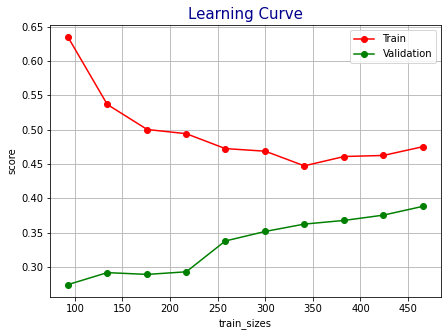

In [202]:
# Courbe d'apprentissage (learning curve)
# montre l'évolution des performances du modèle en fonction de la quantité de données qu'on lui fournit

N, train_score, val_score = learning_curve(best_boost, X_train, y_train, train_sizes = np.linspace(0.2, 1.0, 10), cv = 5)

# Train sizes
print(f"Quantités de données à utiliser pour l'entrainement (10 lots): {N}")

# Learning curve
plt.figure(figsize = (7,5))
plt.grid()
plt.plot(N, train_score.mean(axis = 1), 'o-', color = 'r', label = 'Train')
plt.plot(N, val_score.mean(axis = 1), 'o-', color  = 'g', label = 'Validation')
plt.title ('Learning Curve', fontsize = 15, color = 'darkblue')
plt.legend(loc = 'best')
plt.xlabel('train_sizes')
plt.ylabel('score')
plt.show()

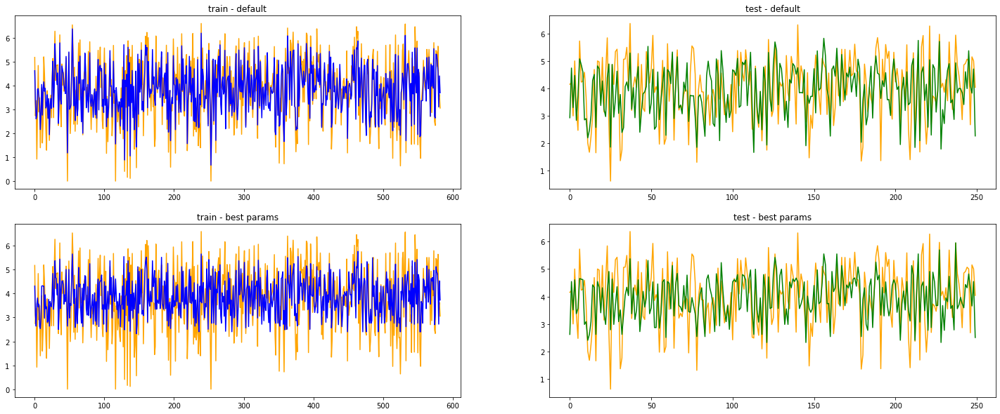

In [203]:
# Plot prédictions

plt.figure(figsize = (25, 10))
plt.subplot(2, 2, 1)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_default, color = 'blue')
plt.title('train - default')
plt.subplot(2, 2, 2)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_default, color = 'green')
plt.title('test - default')
plt.subplot(2, 2, 3)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_best, color = 'blue')
plt.title('train - best params')
plt.subplot(2, 2, 4)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_best, color = 'green')
plt.title('test - best params')

plt.show()

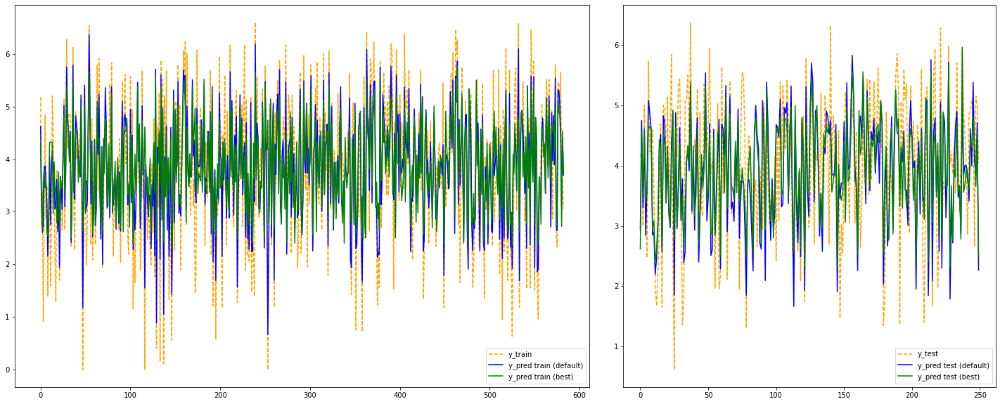

In [204]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred train (default)')
ax1.plot(y_pred_train_best, color = 'green', label = 'y_pred train (best)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred test (default)')
ax2.plot(y_pred_test_best, color = 'green', label = 'y_pred test (best)')
plt.legend(loc = 'best')

plt.show()

In [205]:
########## EVALUATION ##########

model_evaluation(model_name = 'Gradient Boosting Regressor', 
                 model_type = 'Best', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_best, 
                 y_predtest = y_pred_test_best, 
                 temps = temps)

### Synthèse

In [206]:
########## TABLEAU COMPARATIF ##########

energy_star_score = ['score' for i in range(len(model))]

x = PrettyTable()
x.add_column('Modèle', model)
x.add_column('Default/Best', default_best)
x.add_column('Energy Star Score', energy_star_score)
x.add_column("Temps d'execution (s)", temps_execution)
x.add_column('MAE', score_mae)
x.add_column('MSE', score_mse)
x.add_column('RMSE', score_rmse)
x.add_column('R2 train', score_r2_train)
x.add_column('R2 test', score_r2_test)

x

Modèle,Default/Best,Energy Star Score,Temps d'execution (s),MAE,MSE,RMSE,R2 train,R2 test
Linear regression,Default,score,0.019,0.86,1.15,1.07,0.44,0.13
Linear regression,Best,score,1.722,0.87,1.15,1.07,0.36,0.13
KNN,Default,score,0.001,0.96,1.44,1.2,0.35,-0.09
KNN,Best,score,53.915,0.9,1.17,1.08,1.0,0.12
SVR,Default,score,0.022,0.85,1.1,1.05,0.55,0.17
SVR,Best,score,75.392,0.83,1.01,1.01,0.32,0.23
Random Forest Regressor,Default,score,0.282,0.84,1.08,1.04,0.91,0.18
Random Forest Regressor,Best,score,113.343,0.84,1.06,1.03,0.63,0.2
Gradient Boosting Regressor,Default,score,0.095,0.81,1.0,1.0,0.76,0.24
Gradient Boosting Regressor,Best,score,5128.205,0.79,0.95,0.97,0.47,0.28


In [207]:
# Faire dataframe

results = pd.DataFrame()
results['Modèle'] = model
results['Default/Best'] = default_best
results['Energy Star Score'] = energy_star_score
results["Temps d'execution (s)"] = temps_execution
results['MAE'] = score_mae
results['MSE'] = score_mse
results['RMSE'] = score_rmse
results['R2 train'] =score_r2_train
results['R2 test'] = score_r2_test

results['Model'] = results['Modèle'] + ' ' + results['Default/Best']

In [208]:
results.drop(['Energy Star Score'], axis = 1)

,Modèle,Default/Best,Temps d'execution (s),MAE,MSE,RMSE,R2 train,R2 test,Model
0,Linear regression,Default,0.019,0.86,1.15,1.07,0.44,0.13,Linear regression Default
1,Linear regression,Best,1.722,0.87,1.15,1.07,0.36,0.13,Linear regression Best
2,KNN,Default,0.001,0.96,1.44,1.20,0.35,-0.09,KNN Default
3,KNN,Best,53.915,0.90,1.17,1.08,1.00,0.12,KNN Best
4,SVR,Default,0.022,0.85,1.10,1.05,0.55,0.17,SVR Default
5,SVR,Best,75.392,0.83,1.01,1.01,0.32,0.23,SVR Best
6,Random Forest Regressor,Default,0.282,0.84,1.08,1.04,0.91,0.18,Random Forest Regressor Default
7,Random Forest Regressor,Best,113.343,0.84,1.06,1.03,0.63,0.20,Random Forest Regressor Best
8,Gradient Boosting Regressor,Default,0.095,0.81,1.00,1.00,0.76,0.24,Gradient Boosting Regressor Default
9,Gradient Boosting Regressor,Best,5128.205,0.79,0.95,0.97,0.47,0.28,Gradient Boosting Regressor Best


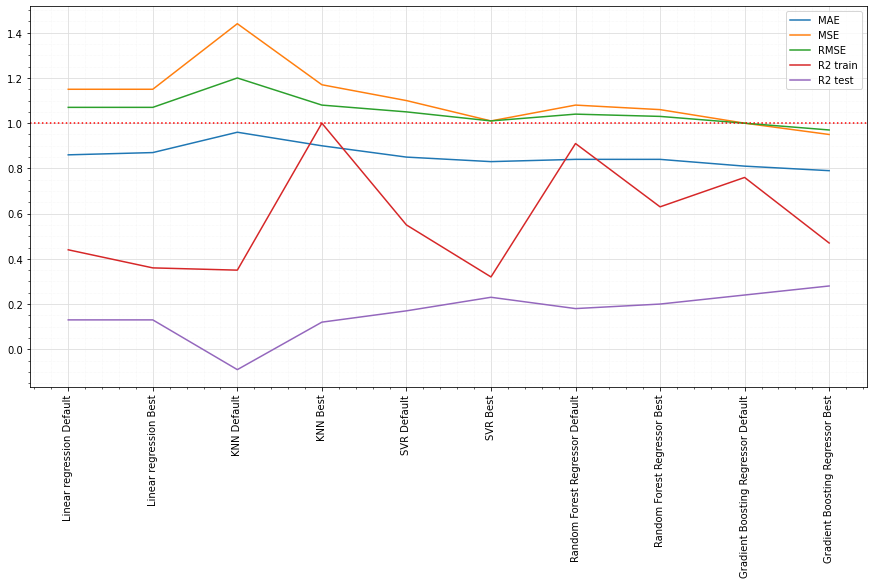

In [209]:
# plot results
plt.figure(figsize = (15, 7))
for i in results.drop(['Model', 'Modèle', 'Default/Best', "Temps d'execution (s)", 'Energy Star Score'], axis = 1).columns:
    plt.plot(results['Model'], results[i], label = i)
plt.axhline(y = 1, color = 'r', linestyle = ':')
plt.legend(loc = 'best')
plt.grid(which = 'major', color = '#DDDDDD', linewidth = 0.8)
plt.grid(which = 'minor', color = '#EEEEEE', linestyle = ':', linewidth = 0.5)
plt.minorticks_on()
plt.xticks(rotation = 90)
plt.show()

In [210]:
# ordonner avec mse pour améliorer lisibilité

In [211]:
# BEST MODEL

best_model = best_boost

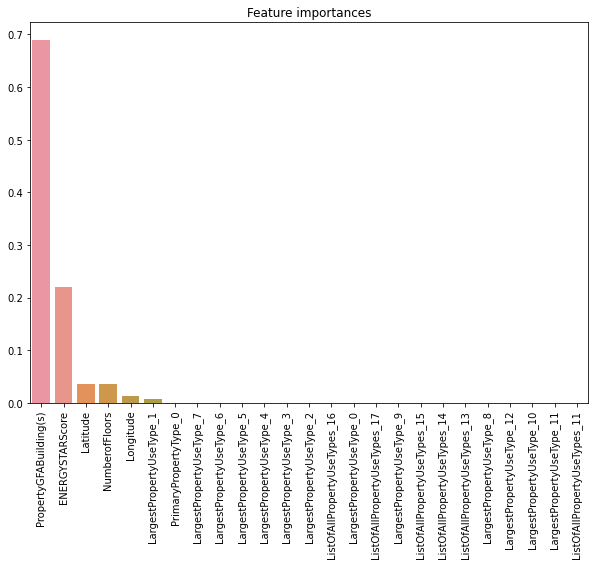

In [212]:
########## FEATURES IMPORTANTES ##########
# identifier les features importantes

# get importance
score = best_model.feature_importances_
feature = X.columns #(pour ne pas prendre l'index)

# transformer en df pour visualiser plus facilement
df_feature = pd.DataFrame()
df_feature['feature'] = feature
df_feature['score'] = score

df_feature.sort_values(['score'], ascending = False, inplace = True)

# bar plot pour visualiser les 25 features les plus importantes
plt.figure(figsize = (10, 7))
plt.title('Feature importances')
sns.barplot(x = df_feature['feature'].values[:25], y = df_feature['score'].values[:25])
plt.xticks(rotation = 90)
plt.show()

## Sans energy star score

### Data preparation 

In [213]:
########## TARGET ##########

# Separating features X and labels y

# target = consommation en energie
# (seconde target = SiteEnergyUseWN(kBtu) -> cf autre notebook)

X = df.drop(['TotalGHGEmissions', 'ENERGYSTARScore', 'index'], axis = 1)
y = df['TotalGHGEmissions']

In [214]:
########## DATA SCALING ##########

#It exists many methods to scale your data but the most popular are:
#- StandardScaler: standardizes features by removing the mean and dividing by the Standard Deviation.
#- MinMaxScaler: standardizes features such that it is in a given range ([0-1] per default). For each feature, it removes XMin_feature and divides by (XMax_feature - XMin_feature)
#- Normalize (with L2 norm): scales samples individually to unit L2 norm.

# Initier le scaler
scaler = StandardScaler()

# scaler variables
scaler.fit(X, y)
X_scaled = scaler.transform(X)

In [215]:
########## TRAIN TEST SPLIT ##########
# Separer les données en un train_set et un test_set

X_train, X_test, y_train, y_test = train_test_split(X_scaled, 
                                                    y,
                                                    test_size = 0.3,
                                                    random_state = 10)

print("Le dataset d'entraînement contient {} lignes".format(len(X_train)))
print("Le dataset de test contient {} lignes".format(len(X_test)))

Le dataset d'entraînement contient 583 lignes
Le dataset de test contient 250 lignes


### Modèle 1 - Regression linéaire

In [216]:
########## Linear Regression Default Params ##########

# début de l'execution
start = time.time()

# Instancier le modèle
lr = LinearRegression()

# Entrainer le modèle
lr.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Score
print(f'Coefficient de détermination (R2) = {lr.score(X_test, y_test)}')

# Predire
y_pred_test_default = lr.predict(X_test)
y_pred_train_default = lr.predict(X_train)

Coefficient de détermination (R2) = 0.10836733894603778


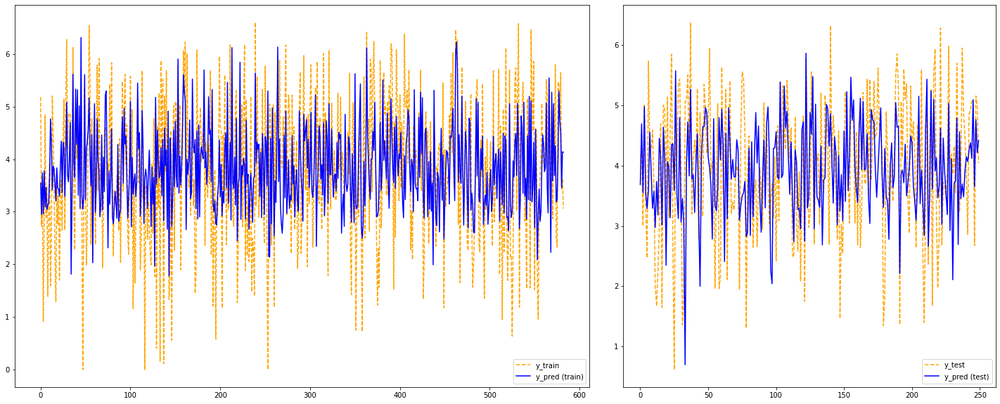

In [217]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred (train)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred (test)')
plt.legend(loc = 'best')

plt.show()

In [218]:
########## EVALUATION ##########

model_evaluation(model_name = 'Linear regression', 
                 model_type = 'Default', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_default, 
                 y_predtest = y_pred_test_default, 
                 temps = temps)

In [219]:
%%time

########## GRIDSEARCH CV ##########
# -> construit une grille de modèles avec toutes les combinaisons d'hyperparamètres présents dans "param_grid"

# début de l'execution
start = time.time()

# Modèle
lr = LinearRegression()

# Hyperparamètres et valeurs à tester
param_grid = {'fit_intercept': [True, False], # default = True
              'copy_X': [True, False], # default = True
              'n_jobs' : [1, 2, 3, 4, 5, None], # default = None
              'positive': [True, False] # default = False
             }

# Grid Search CV
grid = GridSearchCV(lr,
                    param_grid,
                    scoring = 'neg_mean_squared_error',
                    cv = 5,
                    verbose = 1,
                    n_jobs = -1
                   )

# On entraîne la grille 
grid.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Meilleur score obtenu: best_score_
print(f'\nBest score = {grid.best_score_}')

# Optimal hyperparameters: best_params_
display(grid.best_params_)

# Sauvegarder le meilleur modèle
best_lr = grid.best_estimator_

# Tester le meilleur modèle sur données test
print(f'Coefficient de détermination (R2) = {best_lr.score(X_test, y_test)}\n')

# Predire
y_pred_test_best = best_lr.predict(X_test)
y_pred_train_best = best_lr.predict(X_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits

Best score = -1.5603178600144505


{'copy_X': True, 'fit_intercept': True, 'n_jobs': 1, 'positive': True}

Coefficient de détermination (R2) = 0.12941238196767058

CPU times: user 103 ms, sys: 13.9 ms, total: 117 ms
Wall time: 222 ms


Quantités de données à utiliser pour l'entrainement (10 lots): [ 93 134 176 217 258 300 341 383 424 466]


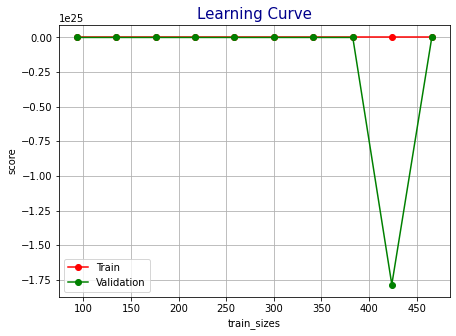

In [220]:
# Courbe d'apprentissage (learning curve)
# montre l'évolution des performances du modèle en fonction de la quantité de données qu'on lui fournit

N, train_score, val_score = learning_curve(best_lr, X_train, y_train, train_sizes = np.linspace(0.2, 1.0, 10), cv = 5)

# Train sizes
print(f"Quantités de données à utiliser pour l'entrainement (10 lots): {N}")

# Learning curve
plt.figure(figsize = (7, 5))
plt.grid()
plt.plot(N, train_score.mean(axis = 1), 'o-', color = 'r', label = 'Train')
plt.plot(N, val_score.mean(axis = 1), 'o-', color  = 'g', label = 'Validation')
plt.title ('Learning Curve', fontsize = 15, color = 'darkblue')
plt.legend(loc = 'best')
plt.xlabel('train_sizes')
plt.ylabel('score')
plt.show()

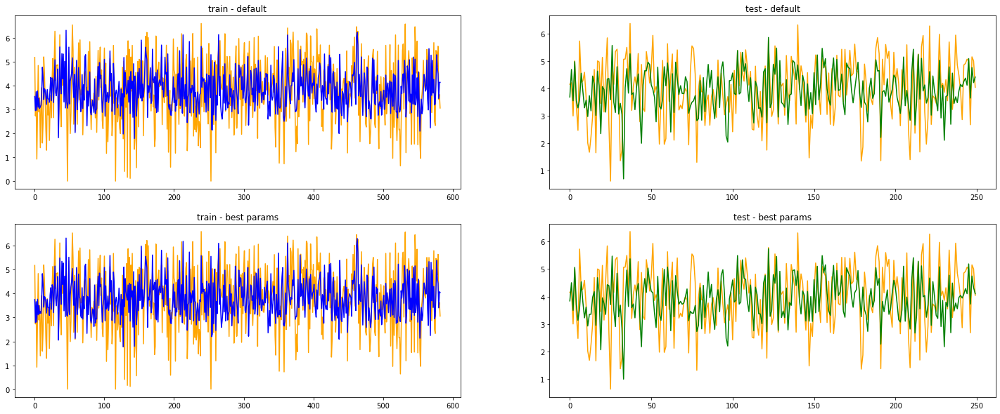

In [221]:
# Plot prédictions

plt.figure(figsize = (25, 10))
plt.subplot(2, 2, 1)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_default, color = 'blue')
plt.title('train - default')
plt.subplot(2, 2, 2)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_default, color = 'green')
plt.title('test - default')
plt.subplot(2, 2, 3)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_best, color = 'blue')
plt.title('train - best params')
plt.subplot(2, 2, 4)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_best, color = 'green')
plt.title('test - best params')

plt.show()

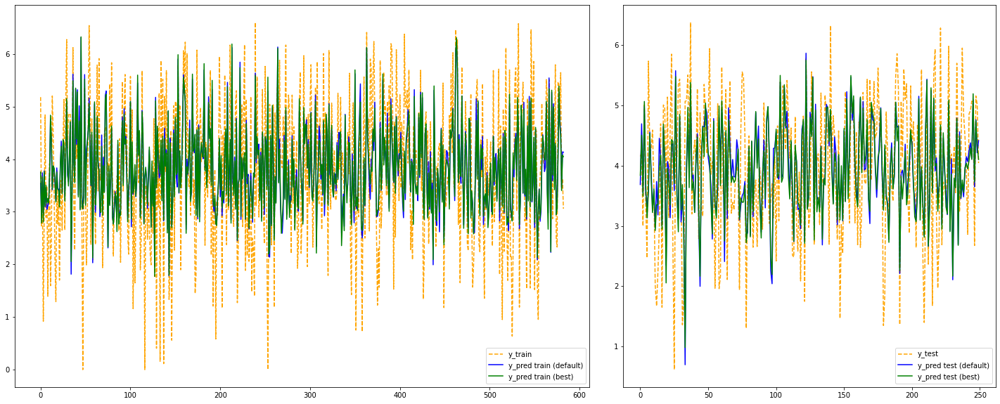

In [222]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred train (default)')
ax1.plot(y_pred_train_best, color = 'green', label = 'y_pred train (best)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred test (default)')
ax2.plot(y_pred_test_best, color = 'green', label = 'y_pred test (best)')
plt.legend(loc = 'best')

plt.show()

In [223]:
########## EVALUATION ##########

model_evaluation(model_name = 'Linear regression', 
                 model_type = 'Best', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_best, 
                 y_predtest = y_pred_test_best, 
                 temps = temps)

### Modèle 2 - KNeighborsRegressor

In [224]:
########## KNN Default Params ##########

# début de l'execution
start = time.time()

# Instancier le modèle
knn = KNeighborsRegressor()

# Entrainer le modèle
knn.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Score
print(f'Coefficient de détermination (R2) = {knn.score(X_test, y_test)}')

# Predire
y_pred_test_default = knn.predict(X_test)
y_pred_train_default = knn.predict(X_train)

Coefficient de détermination (R2) = -0.08589249290362644


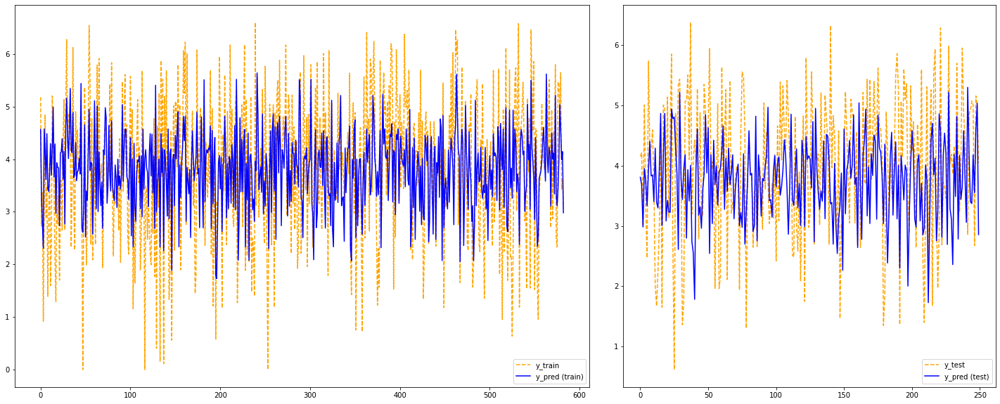

In [225]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred (train)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred (test)')
plt.legend(loc = 'best')

plt.show()

In [226]:
########## EVALUATION ##########

model_evaluation(model_name = 'KNN', 
                 model_type = 'Default', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_default, 
                 y_predtest = y_pred_test_default, 
                 temps = temps)

In [227]:
%%time

########## GRIDSEARCH CV ##########

# début de l'execution
start = time.time()

# Modèle
knn = KNeighborsRegressor()

# Paramètres
# avec algo et leaf size -> plus de 7h

param_grid = [{
    'n_neighbors': list(range(1, 51)), # default = 5
    'weights': ['uniform', 'distance'], # default = ’uniform’
    #'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'], # default = ’auto’
    #'leaf_size' : list(range(20, 41)), # default = 30
    'p' : [1, 2, 3, 4, 5], # default = 2
    'metric': ['euclidean', 'manhattan', 'minkowski'], # default = ’minkowski’
    'n_jobs' : [1, 2, 3, 4, 5] # default = None
}]

# Grid Search CV
grid = GridSearchCV(knn,
                    param_grid,
                    scoring = 'neg_mean_squared_error',
                    cv = 5,
                    verbose = 1,
                    n_jobs = -1
                   )

# On entraîne la grille 
grid.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Meilleur score obtenu: best_score_
print(f'\nBest score = {grid.best_score_}')

# Optimal hyperparameters: best_params_
display(grid.best_params_)

# Sauvegarder le meilleur modèle
best_knn = grid.best_estimator_

# Tester le meilleur modèle sur données test
print(f'Coefficient de détermination (R2) = {best_knn.score(X_test, y_test)}\n')

# Predire
y_pred_test_best = best_knn.predict(X_test)
y_pred_train_best = best_knn.predict(X_train)

Fitting 5 folds for each of 7500 candidates, totalling 37500 fits

Best score = -1.598325583886559


{'metric': 'manhattan',
 'n_jobs': 1,
 'n_neighbors': 50,
 'p': 1,
 'weights': 'distance'}

Coefficient de détermination (R2) = 0.11265490844353832

CPU times: user 4.17 s, sys: 399 ms, total: 4.57 s
Wall time: 54.5 s


Quantités de données à utiliser pour l'entrainement (10 lots): [ 93 134 176 217 258 300 341 383 424 466]


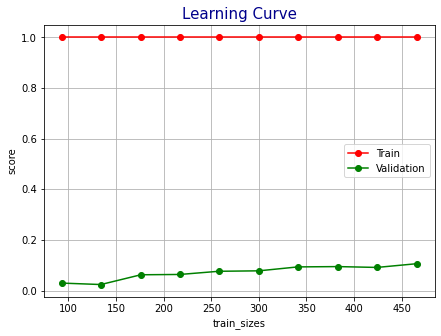

In [228]:
# Courbe d'apprentissage (learning curve)
# montre l'évolution des performances du modèle en fonction de la quantité de données qu'on lui fournit

N, train_score, val_score = learning_curve(best_knn, X_train, y_train, train_sizes = np.linspace(0.2, 1.0, 10), cv = 5)

# Train sizes
print(f"Quantités de données à utiliser pour l'entrainement (10 lots): {N}")

# Learning curve
plt.figure(figsize = (7,5))
plt.grid()
plt.plot(N, train_score.mean(axis = 1), 'o-', color = 'r', label = 'Train')
plt.plot(N, val_score.mean(axis = 1), 'o-', color  = 'g', label = 'Validation')
plt.title ('Learning Curve', fontsize = 15, color = 'darkblue')
plt.legend(loc = 'best')
plt.xlabel('train_sizes')
plt.ylabel('score')
plt.show()

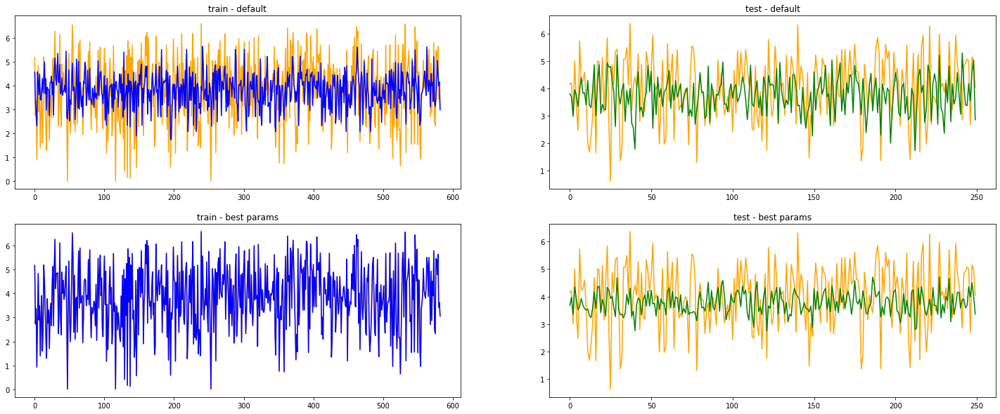

In [229]:
# Plot prédictions

plt.figure(figsize = (25, 10))
plt.subplot(2, 2, 1)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_default, color = 'blue')
plt.title('train - default')
plt.subplot(2, 2, 2)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_default, color = 'green')
plt.title('test - default')
plt.subplot(2, 2, 3)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_best, color = 'blue')
plt.title('train - best params')
plt.subplot(2, 2, 4)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_best, color = 'green')
plt.title('test - best params')

plt.show()

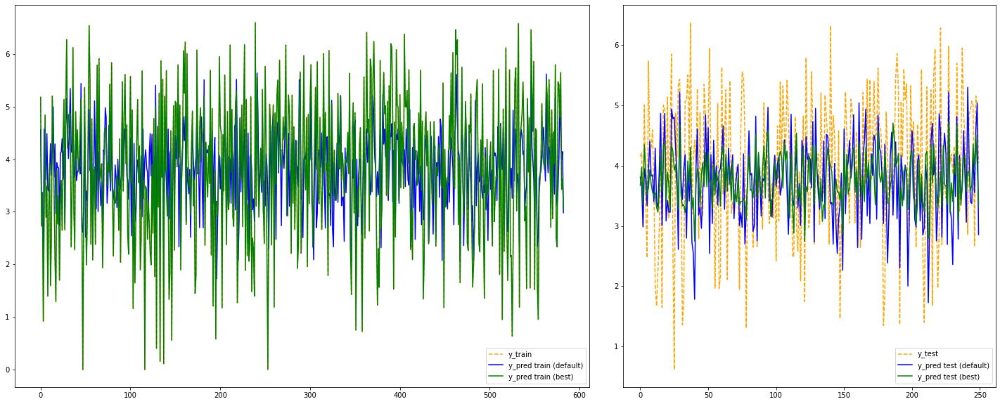

In [230]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred train (default)')
ax1.plot(y_pred_train_best, color = 'green', label = 'y_pred train (best)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred test (default)')
ax2.plot(y_pred_test_best, color = 'green', label = 'y_pred test (best)')
plt.legend(loc = 'best')

plt.show()

In [231]:
########## EVALUATION ##########

model_evaluation(model_name = 'KNN', 
                 model_type = 'Best', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_best, 
                 y_predtest = y_pred_test_best, 
                 temps = temps)

### Modèle 3 - Support Vector Machine Regressor

In [232]:
########## SVR Default Params ##########

# début de l'execution
start = time.time()

# Instancier le modèle
svr = SVR()

# Entrainer le modèle
svr.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Score
print(f'Coefficient de détermination (R2) = {svr.score(X_test, y_test)}')

# Predire
y_pred_test_default = svr.predict(X_test)
y_pred_train_default = svr.predict(X_train)

Coefficient de détermination (R2) = 0.12292830474412275


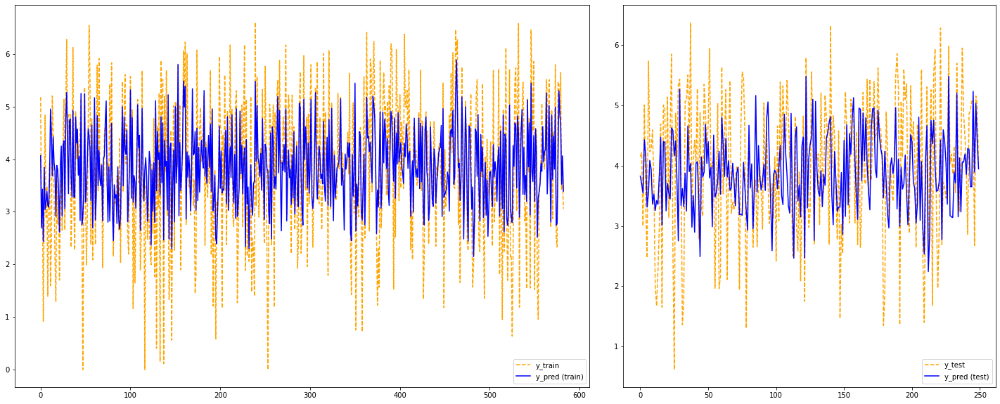

In [233]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred (train)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred (test)')
plt.legend(loc = 'best')

plt.show()

In [234]:
########## EVALUATION ##########

model_evaluation(model_name = 'SVR', 
                 model_type = 'Default', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_default, 
                 y_predtest = y_pred_test_default, 
                 temps = temps)

In [235]:
%%time

########## GRIDSEARCH CV ##########

# début de l'execution
start = time.time()

# Modèle
svr = SVR()

# Paramètres
param_grid = {
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'], # default = ’rbf’
    'C': [1, 5, 10], # default = 1.0
    'gamma': ['auto','scale'], # default = ’scale’
    'epsilon': [0, 0.01, 0.1, 0.2, 0.5, 1, 2], # default = 0.1
    'shrinking': [True, False], # default = True
    'max_iter' : [-1, 10, 100, 1000] #default = -1
}

# Grid Search CV
grid = GridSearchCV(svr, 
                    param_grid,
                    scoring = 'neg_mean_squared_error',
                    cv = 5,
                    verbose = 1,
                    n_jobs = -1
                   )

# On entraîne la grille 
grid.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Meilleur score obtenu: best_score_
print(f'Best score = {grid.best_score_}')

# Optimal hyperparameters: best_params_
display(grid.best_params_) 

# Sauvegarder le meilleur modèle
best_svr = grid.best_estimator_

# Tester le meilleur modèle sur données test
print(f'Coefficient de détermination (R2) = {best_svr.score(X_test, y_test)}\n')

# Predire
y_pred_test_best = best_svr.predict(X_test)
y_pred_train_best = best_svr.predict(X_train)

Fitting 5 folds for each of 1344 candidates, totalling 6720 fits


/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lu

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/User

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/User

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luci

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/luc

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=100).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/l

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Use

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

Best score = -1.4850872403548385


/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucilerabeau/.pyenv/versions/artefact/lib/python3.9/site-packages/sklearn/svm/_base.py:284: ConvergenceWarning: Solver terminated early (max_iter=10).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/Users/lucil

{'C': 1,
 'epsilon': 0.5,
 'gamma': 'auto',
 'kernel': 'sigmoid',
 'max_iter': 100,
 'shrinking': True}

Coefficient de détermination (R2) = 0.06483857251257819

CPU times: user 2.39 s, sys: 336 ms, total: 2.72 s
Wall time: 1min 7s


Quantités de données à utiliser pour l'entrainement (10 lots): [ 93 134 176 217 258 300 341 383 424 466]


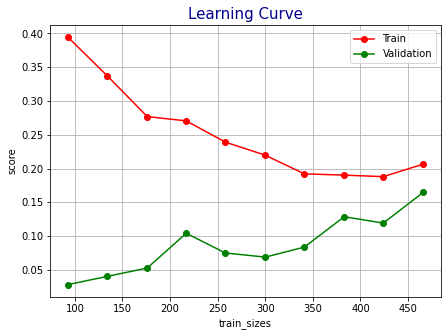

In [236]:
# Courbe d'apprentissage (learning curve)
# montre l'évolution des performances du modèle en fonction de la quantité de données qu'on lui fournit

N, train_score, val_score = learning_curve(best_svr, X_train, y_train, train_sizes = np.linspace(0.2, 1.0, 10), cv = 5)

# Train sizes
print(f"Quantités de données à utiliser pour l'entrainement (10 lots): {N}")

# Learning curve
plt.figure(figsize = (7,5))
plt.grid()
plt.plot(N, train_score.mean(axis = 1), 'o-', color = 'r', label = 'Train')
plt.plot(N, val_score.mean(axis = 1), 'o-', color  = 'g', label = 'Validation')
plt.title ('Learning Curve', fontsize = 15, color = 'darkblue')
plt.legend(loc = 'best')
plt.xlabel('train_sizes')
plt.ylabel('score')
plt.show()

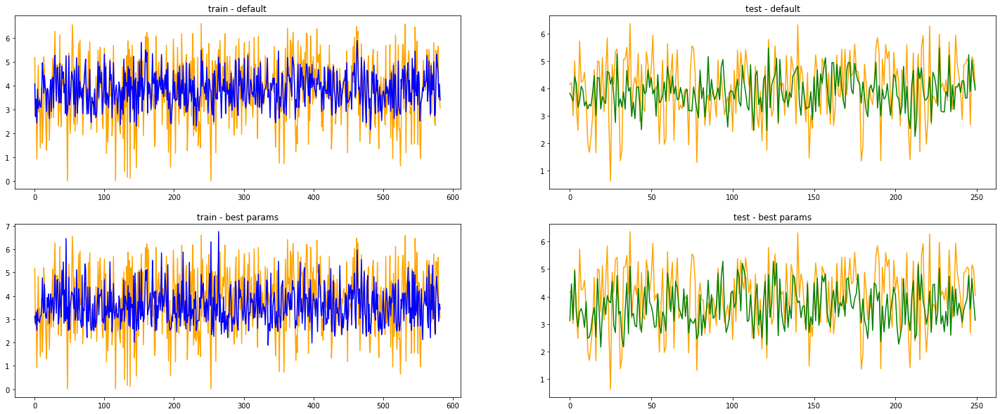

In [237]:
# Plot prédictions

plt.figure(figsize = (25, 10))
plt.subplot(2, 2, 1)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_default, color = 'blue')
plt.title('train - default')
plt.subplot(2, 2, 2)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_default, color = 'green')
plt.title('test - default')
plt.subplot(2, 2, 3)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_best, color = 'blue')
plt.title('train - best params')
plt.subplot(2, 2, 4)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_best, color = 'green')
plt.title('test - best params')

plt.show()

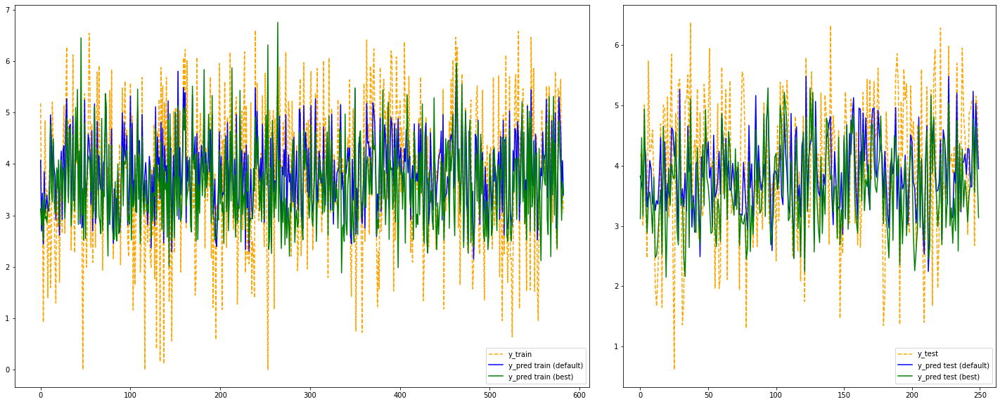

In [238]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred train (default)')
ax1.plot(y_pred_train_best, color = 'green', label = 'y_pred train (best)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred test (default)')
ax2.plot(y_pred_test_best, color = 'green', label = 'y_pred test (best)')
plt.legend(loc = 'best')

plt.show()

In [239]:
########## EVALUATION ##########

model_evaluation(model_name = 'SVR', 
                 model_type = 'Best', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_best, 
                 y_predtest = y_pred_test_best, 
                 temps = temps)

### Modèle 4 - Random Forest Regressor

In [240]:
########## Random Forest Regressor Default Params ##########

# début de l'execution
start = time.time()

# Instancier le modèle
forest = RandomForestRegressor()

# Entrainer le modèle
forest.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Score
print(f'Coefficient de détermination (R2) = {forest.score(X_test, y_test)}')

# Predire
y_pred_test_default = forest.predict(X_test)
y_pred_train_default = forest.predict(X_train)

Coefficient de détermination (R2) = 0.21602932858483714


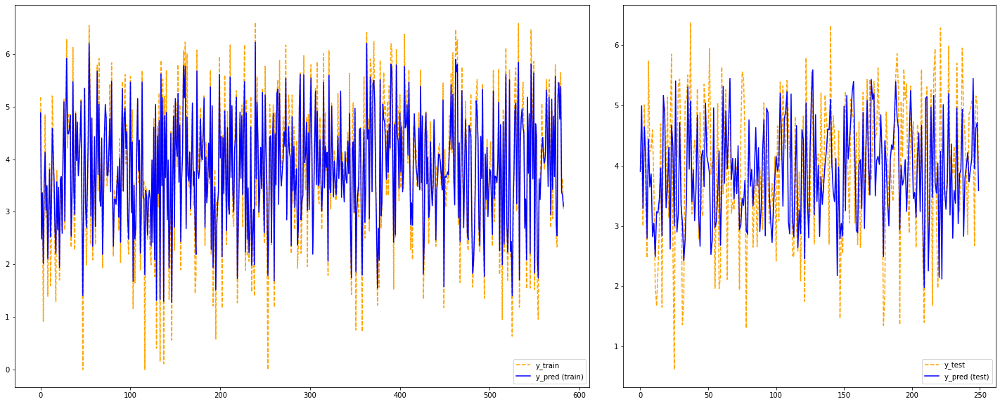

In [241]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred (train)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred (test)')
plt.legend(loc = 'best')

plt.show()

In [242]:
########## EVALUATION ##########

model_evaluation(model_name = 'Random Forest Regressor', 
                 model_type = 'Default', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_default, 
                 y_predtest = y_pred_test_default, 
                 temps = temps)

In [243]:
%%time

########## GRIDSEARCH CV ##########

start = time.time()

# Modèle
forest = RandomForestRegressor()

# Paramètres
param_grid = [
    {'n_estimators': [5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 20, 30, 40, 50, 60, 70, 80, 90, 100], # default = 100
     'max_depth' : [5, 10, 15, 25, 50, None], # default = None
     'min_samples_split' : [2, 5, 10], # default = 2
     'max_features': ['auto', 'sqrt', 'log2', None], # default = 1.0
     'bootstrap': [True, False] # default = True
  }]

# Grid search CV
grid = GridSearchCV(forest, 
                    param_grid,
                    scoring = 'neg_mean_squared_error',
                    cv = 5,
                    verbose = 1,
                    n_jobs = -1
                   )

# On entraîne la grille 
grid.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Meilleur score obtenu: best_score_
print(f'\nBest score = {grid.best_score_}')

# Optimal hyperparameters: best_params_
display(grid.best_params_) 

# Sauvegarder le meilleur modèle
best_forest = grid.best_estimator_

# Tester le meilleur modèle sur données test
print(f'Coefficient de détermination (R2) = {best_forest.score(X_test, y_test)}\n')

# Predire
y_pred_test_best = best_forest.predict(X_test)
y_pred_train_best = best_forest.predict(X_train)

Fitting 5 folds for each of 2736 candidates, totalling 13680 fits

Best score = -1.2874543173110933


{'bootstrap': True,
 'max_depth': 5,
 'max_features': 'auto',
 'min_samples_split': 2,
 'n_estimators': 50}

Coefficient de détermination (R2) = 0.25450186576050626

CPU times: user 6.73 s, sys: 796 ms, total: 7.53 s
Wall time: 1min 50s


Quantités de données à utiliser pour l'entrainement (10 lots): [ 93 134 176 217 258 300 341 383 424 466]


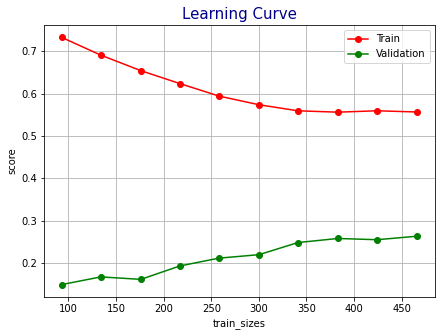

In [244]:
# Courbe d'apprentissage (learning curve)
# montre l'évolution des performances du modèle en fonction de la quantité de données qu'on lui fournit

N, train_score, val_score = learning_curve(best_forest, X_train, y_train, train_sizes = np.linspace(0.2, 1.0, 10), cv = 5)

# Train sizes
print(f"Quantités de données à utiliser pour l'entrainement (10 lots): {N}")

# Learning curve
plt.figure(figsize = (7,5))
plt.grid()
plt.plot(N, train_score.mean(axis = 1), 'o-', color = 'r', label = 'Train')
plt.plot(N, val_score.mean(axis = 1), 'o-', color  = 'g', label = 'Validation')
plt.title ('Learning Curve', fontsize = 15, color = 'darkblue')
plt.legend(loc = 'best')
plt.xlabel('train_sizes')
plt.ylabel('score')
plt.show()

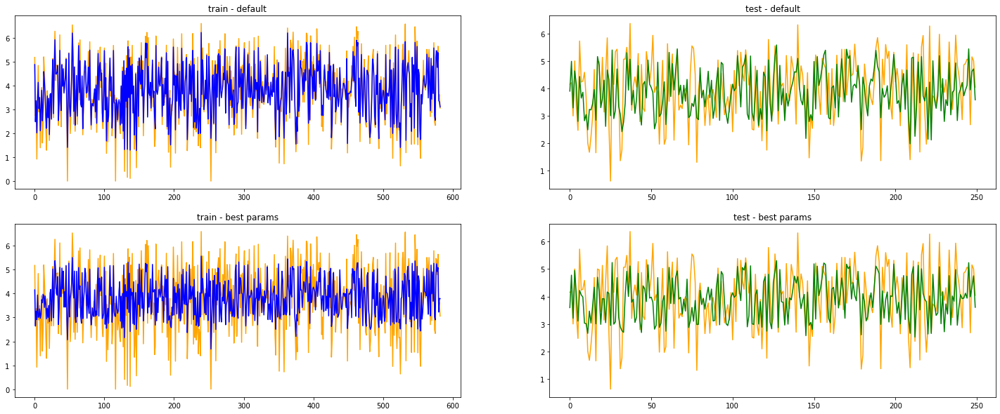

In [245]:
# Plot prédictions

plt.figure(figsize = (25, 10))
plt.subplot(2, 2, 1)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_default, color = 'blue')
plt.title('train - default')
plt.subplot(2, 2, 2)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_default, color = 'green')
plt.title('test - default')
plt.subplot(2, 2, 3)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_best, color = 'blue')
plt.title('train - best params')
plt.subplot(2, 2, 4)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_best, color = 'green')
plt.title('test - best params')

plt.show()

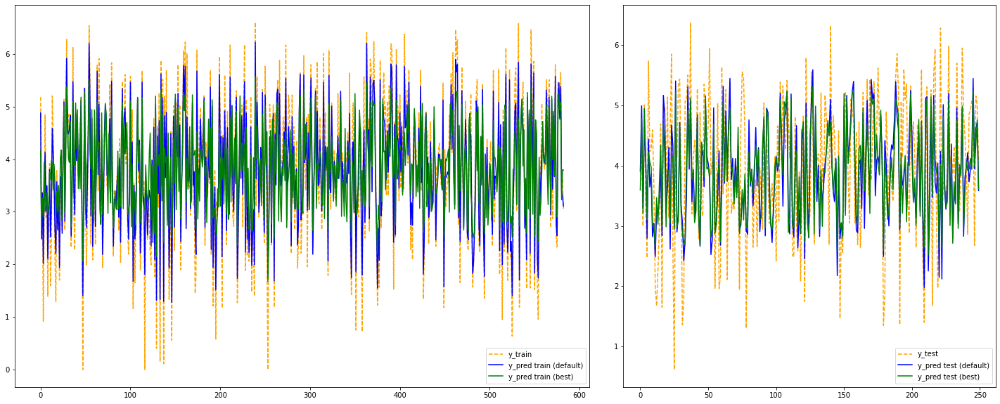

In [246]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred train (default)')
ax1.plot(y_pred_train_best, color = 'green', label = 'y_pred train (best)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred test (default)')
ax2.plot(y_pred_test_best, color = 'green', label = 'y_pred test (best)')
plt.legend(loc = 'best')

plt.show()

In [247]:
########## EVALUATION ##########

model_evaluation(model_name = 'Random Forest Regressor', 
                 model_type = 'Best', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_best, 
                 y_predtest = y_pred_test_best, 
                 temps = temps)

### Modèle 5 - Gradient Boosting Regressor

In [248]:
########## XGBoost Default Params ##########

# début de l'execution
start = time.time()

# Instancier le modèle
boost = GradientBoostingRegressor()

# Entrainer le modèle
boost.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Score
print(f'Coefficient de détermination (R2) = {boost.score(X_test, y_test)}')

# Predire
y_pred_test_default = boost.predict(X_test)
y_pred_train_default = boost.predict(X_train)

Coefficient de détermination (R2) = 0.2380447775444704


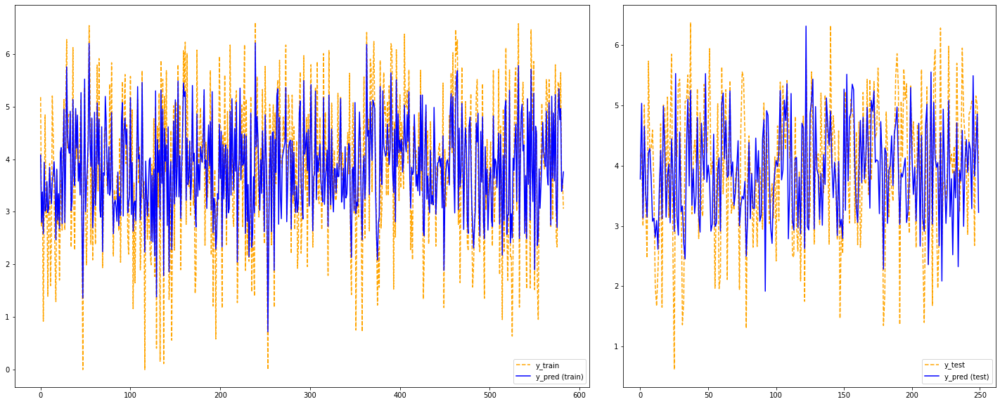

In [249]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred (train)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred (test)')
plt.legend(loc = 'best')

plt.show()

In [250]:
########## EVALUATION ##########

model_evaluation(model_name = 'Gradient Boosting Regressor', 
                 model_type = 'Default', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_default, 
                 y_predtest = y_pred_test_default, 
                 temps = temps)

In [251]:
%%time

########## GRIDSEARCH CV ##########

# début de l'execution
start = time.time()
time_debut = datetime.now()
time_debut_convert = time_debut.strftime('%H:%M:%S')
print(f'Début : {time_debut_convert}\n')

param_grid = {'n_estimators': [25, 50, 100, 200, 500, 1000], # default = 100
              'max_depth': [None, 1, 2, 3, 4, 6, 10, 15, 20], # default = 3
              'min_samples_split': [2, 3, 4, 5], # default = 2
              'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.3], # default = 0.1
              'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'] # default = 'squared_error'
             }

grid = GridSearchCV(GradientBoostingRegressor(),
                    param_grid,
                    scoring = 'neg_mean_squared_error',
                    cv = 5,
                    verbose = 1,
                    n_jobs = -1
                   )

# On entraîne la grille 
grid.fit(X_train, y_train)

# fin de l'execution
end = time.time()
temps = end - start

# Meilleur score obtenu: best_score_
print(f'\nBest score = {grid.best_score_}')

# Optimal hyperparameters: best_params_
display(grid.best_params_) 

# Sauvegarder le meilleur modèle
best_boost = grid.best_estimator_

# Tester le meilleur modèle sur données test
print(f'Coefficient de détermination (R2) = {best_boost.score(X_test, y_test)}\n')

# Predire
y_pred_test_best = best_boost.predict(X_test)
y_pred_train_best = best_boost.predict(X_train)

Début : 23:58:11

Fitting 5 folds for each of 4320 candidates, totalling 21600 fits

Best score = -1.310274538000162


{'learning_rate': 0.2,
 'loss': 'huber',
 'max_depth': 1,
 'min_samples_split': 2,
 'n_estimators': 25}

Coefficient de détermination (R2) = 0.2762259026057907

CPU times: user 33.3 s, sys: 6.78 s, total: 40 s
Wall time: 1h 25min 33s


Quantités de données à utiliser pour l'entrainement (10 lots): [ 93 134 176 217 258 300 341 383 424 466]


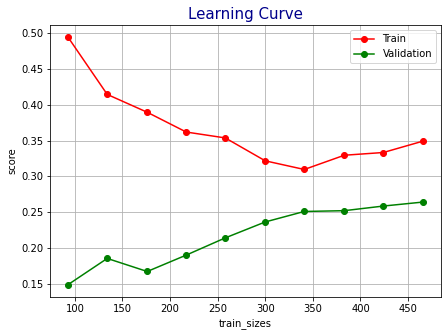

In [252]:
# Courbe d'apprentissage (learning curve)
# montre l'évolution des performances du modèle en fonction de la quantité de données qu'on lui fournit

N, train_score, val_score = learning_curve(best_boost, X_train, y_train, train_sizes = np.linspace(0.2, 1.0, 10), cv = 5)

# Train sizes
print(f"Quantités de données à utiliser pour l'entrainement (10 lots): {N}")

# Learning curve
plt.figure(figsize = (7, 5))
plt.grid()
plt.plot(N, train_score.mean(axis = 1), 'o-', color = 'r', label = 'Train')
plt.plot(N, val_score.mean(axis = 1), 'o-', color  = 'g', label = 'Validation')
plt.title ('Learning Curve', fontsize = 15, color = 'darkblue')
plt.legend(loc = 'best')
plt.xlabel('train_sizes')
plt.ylabel('score')
plt.show()

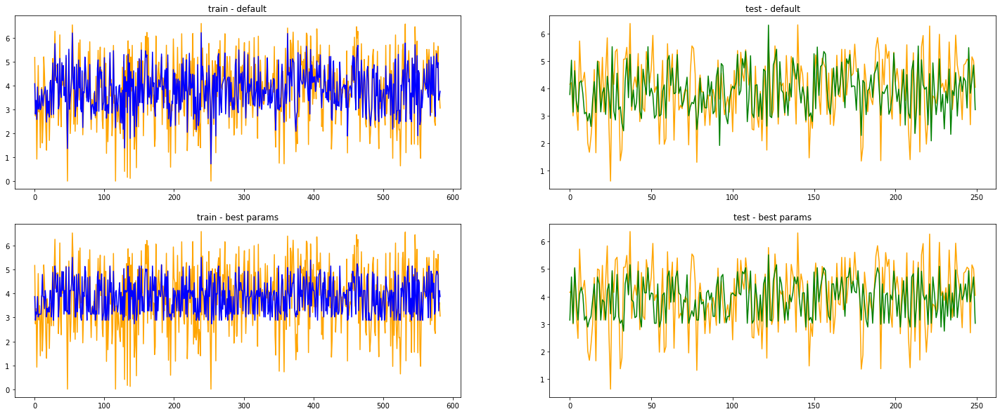

In [253]:
# Plot prédictions

plt.figure(figsize = (25, 10))
plt.subplot(2, 2, 1)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_default, color = 'blue')
plt.title('train - default')
plt.subplot(2, 2, 2)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_default, color = 'green')
plt.title('test - default')
plt.subplot(2, 2, 3)
plt.plot(y_train.values, color = 'orange')
plt.plot(y_pred_train_best, color = 'blue')
plt.title('train - best params')
plt.subplot(2, 2, 4)
plt.plot(y_test.values, color = 'orange')
plt.plot(y_pred_test_best, color = 'green')
plt.title('test - best params')

plt.show()

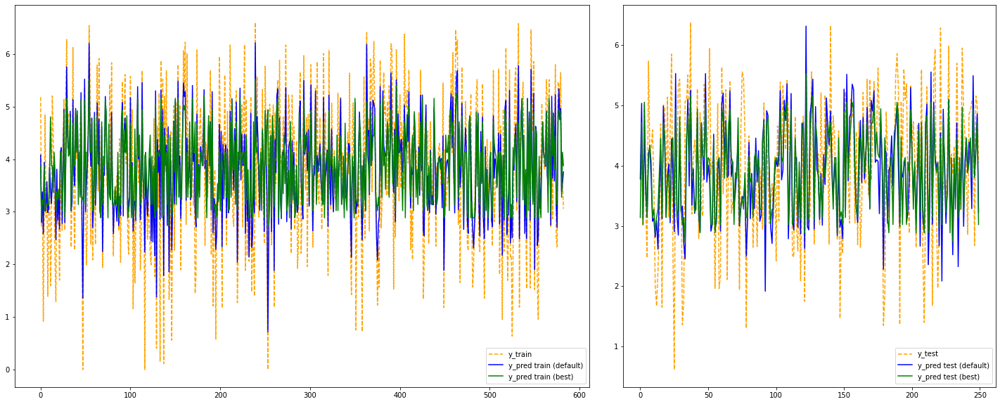

In [254]:
# Plot prédictions

plt.figure(figsize = (25, 10))

ax1 = plt.subplot2grid((1, 5), (0, 0), colspan = 3)
ax1.plot(y_train.values, color = 'orange', linestyle = '--', label = 'y_train')
ax1.plot(y_pred_train_default, color = 'blue', label = 'y_pred train (default)')
ax1.plot(y_pred_train_best, color = 'green', label = 'y_pred train (best)')
plt.legend(loc = 'best')

ax2 = plt.subplot2grid((1, 5), (0, 3), colspan = 2)
ax2.plot(y_test.values, color = 'orange', linestyle = '--', label = 'y_test')
ax2.plot(y_pred_test_default, color = 'blue', label = 'y_pred test (default)')
ax2.plot(y_pred_test_best, color = 'green', label = 'y_pred test (best)')
plt.legend(loc = 'best')

plt.show()

In [255]:
########## EVALUATION ##########

model_evaluation(model_name = 'Gradient Boosting Regressor', 
                 model_type = 'Best', 
                 y_train = y_train, 
                 y_test = y_test, 
                 y_predtrain = y_pred_train_best, 
                 y_predtest = y_pred_test_best, 
                 temps = temps)

### Synthèse 

In [256]:
########## TABLEAU COMPARATIF ##########

energy_star_score.extend(['no score' for i in range(10)])

y = PrettyTable()
y.add_column("Modèle", model)
y.add_column("Default/Best", default_best)
y.add_column("Energy Star Score", energy_star_score)
y.add_column("Temps d'execution (s)", temps_execution)
y.add_column("MAE", score_mae)
y.add_column("MSE", score_mse)
y.add_column("RMSE", score_rmse)
y.add_column("R2 train", score_r2_train)
y.add_column("R2 test", score_r2_test)

y

Modèle,Default/Best,Energy Star Score,Temps d'execution (s),MAE,MSE,RMSE,R2 train,R2 test
Linear regression,Default,score,0.019,0.86,1.15,1.07,0.44,0.13
Linear regression,Best,score,1.722,0.87,1.15,1.07,0.36,0.13
KNN,Default,score,0.001,0.96,1.44,1.2,0.35,-0.09
KNN,Best,score,53.915,0.9,1.17,1.08,1.0,0.12
SVR,Default,score,0.022,0.85,1.1,1.05,0.55,0.17
SVR,Best,score,75.392,0.83,1.01,1.01,0.32,0.23
Random Forest Regressor,Default,score,0.282,0.84,1.08,1.04,0.91,0.18
Random Forest Regressor,Best,score,113.343,0.84,1.06,1.03,0.63,0.2
Gradient Boosting Regressor,Default,score,0.095,0.81,1.0,1.0,0.76,0.24
Gradient Boosting Regressor,Best,score,5128.205,0.79,0.95,0.97,0.47,0.28


In [257]:
# Faire dataframe

results = pd.DataFrame()
results['Modèle'] = model
results['Default/Best'] = default_best
results['Energy Star Score'] = energy_star_score
results["Temps d'execution (s)"] = temps_execution
results["MAE"] = score_mae
results["MSE"] = score_mse
results["RMSE"] = score_rmse
results["R2 train"] = score_r2_train
results["R2 test"] = score_r2_test

In [258]:
# Sort values pour rentre le résultat plus visuel
results.sort_values(['MSE', 'MAE'], ascending = False, inplace = True)

# Ajouter info sur modèle en une seule colonne
results['Energy Star'] = 'test'
results['Energy Star'].loc[results['Energy Star Score'] == True] = 'score'
results['Energy Star'].loc[results['Energy Star Score'] == False] = 'no score'
results['Model'] = results['Modèle'] + ' ' + results['Default/Best'] + ' ' + results['Energy Star']

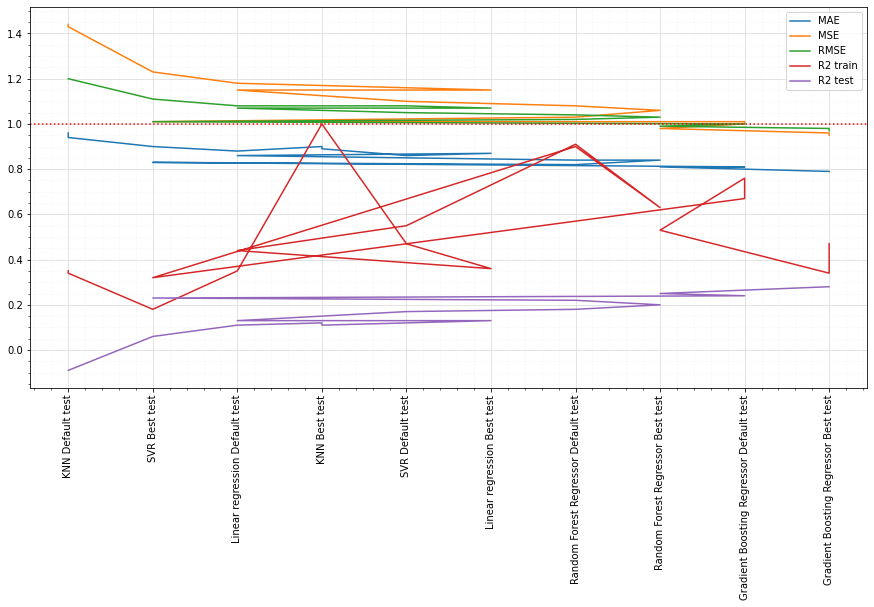

In [259]:
# plot results
plt.figure(figsize = (15, 7))
for i in results.drop(['Model', 'Modèle', 'Default/Best', "Temps d'execution (s)", 'Energy Star', 'Energy Star Score'], axis = 1).columns:
    plt.plot(results['Model'], results[i], label = i)
plt.axhline(y = 1, color = 'r', linestyle = ':')
plt.legend(loc = 'best')
plt.grid(which = 'major', color = '#DDDDDD', linewidth = 0.8)
plt.grid(which = 'minor', color = '#EEEEEE', linestyle = ':', linewidth = 0.5)
plt.minorticks_on()
plt.xticks(rotation = 90)
plt.show()

In [261]:
# Best model
best model = best_boost

SyntaxError: invalid syntax (294965886.py, line 2)

In [ ]:
########## FEATURES IMPORTANTES ##########
# identifier les features importantes

# get importance
score = best_boost.features_importances_
feature = X.columns #(pour ne pas prendre l'index)

# transformer en df pour visualiser plus facilement
df_feature = pd.DataFrame()
df_feature['feature'] = feature
df_feature['score'] = score

df_feature.sort_values(['score'], ascending = False, inplace = True)

# bar plot pour visualiser les 25 features les plus importantes
plt.figure(figsize = (10, 7))
plt.title('Feature importances')
sns.barplot(x = df_feature['feature'].values[:25], y = df_feature['score'].values[:25])
plt.xticks(rotation = 90)
plt.show()